In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

/home/cjw/anaconda3/envs/deep/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/mmCompensatedTifs"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_Ice.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish5_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish5_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_CCB.mm', '/media/cjw/Data/cyto/mmComp

dict_keys(['Fish3_CCB.mm', 'Fish4_ICE.mm', 'Fish3_Untreated.mm', 'Fish6_Untreated.mm', 'Fish2_Untreated.mm', 'Fish1_Ice.mm', 'Fish5_Untreated.mm', 'Fish6_ICE.mm', 'Fish4_CCB.mm', 'Fish6_CCB.mm', 'Fish2_CCB.mm', 'Fish1_Untreated.mm', 'Fish4_Untreated.mm', 'Fish2_ICE.mm', 'Fish5_CCB.mm', 'Fish3_ICE.mm', 'Fish1_CCB.mm', 'Fish5_ICE.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


Encoder True
isize:  4 32
dh0 (?, 32, 32, 1)
180000 1406 128
Epoch:  0 Iteration:  0 Loss:  71.440285 70.94743 0.49284977


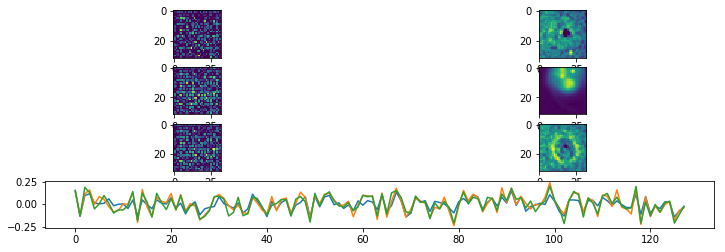

Epoch:  0 Iteration:  200 Loss:  1.5098757 1.0579121 0.45196357


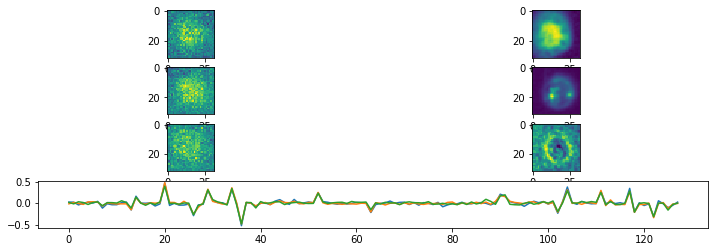

Epoch:  0 Iteration:  400 Loss:  1.0125805 0.7789147 0.23366587


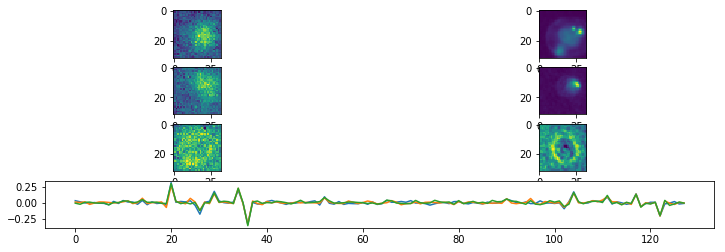

Epoch:  0 Iteration:  600 Loss:  0.80333906 0.65275025 0.1505888


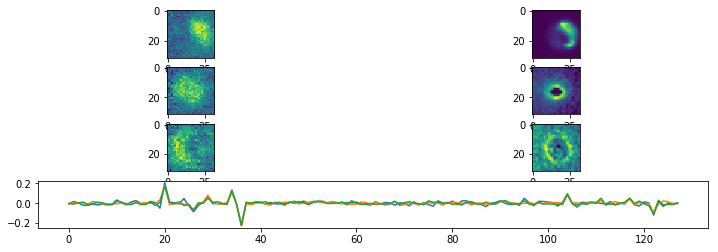

Epoch:  0 Iteration:  800 Loss:  0.64202017 0.54694057 0.09507959


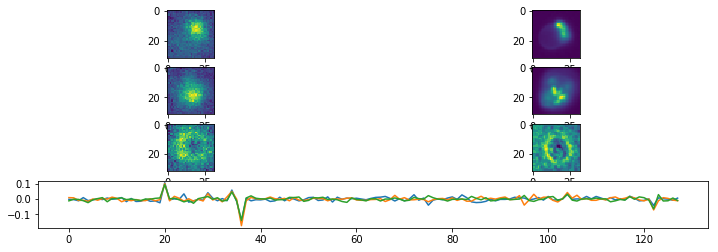

Epoch:  0 Iteration:  1000 Loss:  0.56255406 0.49469063 0.06786341


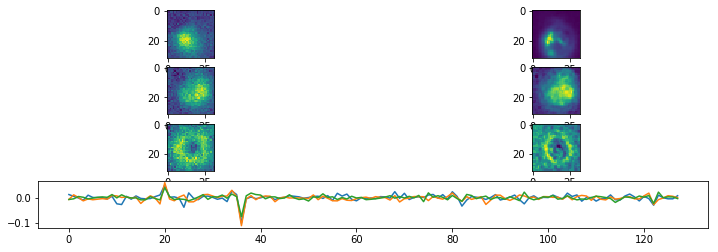

Epoch:  0 Iteration:  1200 Loss:  0.4428464 0.3879456 0.0549008


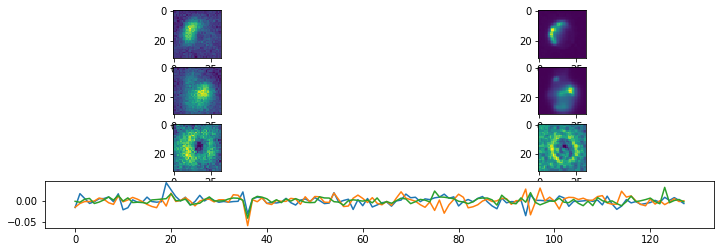

Epoch:  0 Iteration:  1400 Loss:  0.41637993 0.36639675 0.049983174


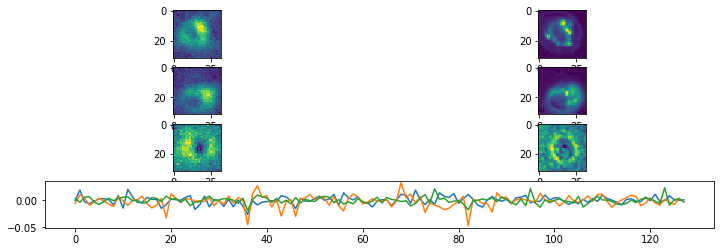

Epoch:  1 Iteration:  0 Loss:  0.45346826 0.40117204 0.05229623


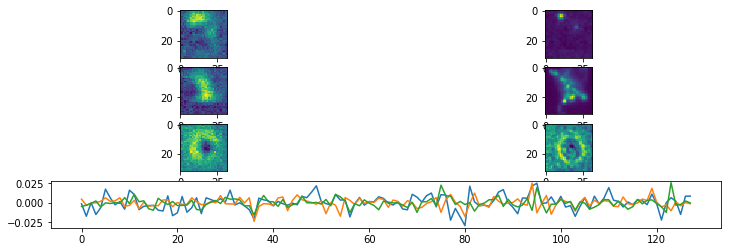

Epoch:  1 Iteration:  200 Loss:  0.40523753 0.3615681 0.043669425


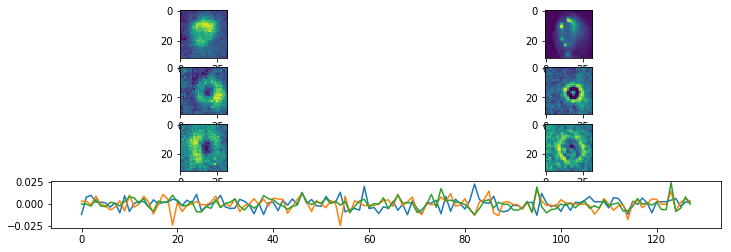

Epoch:  1 Iteration:  400 Loss:  0.369294 0.32802957 0.041264415


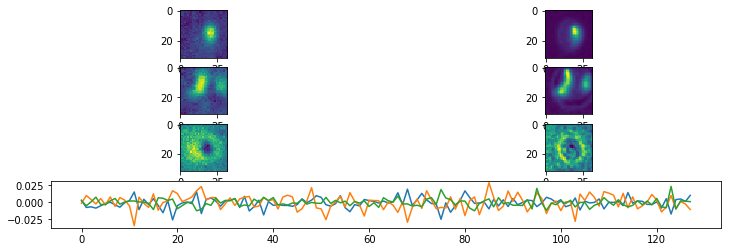

Epoch:  1 Iteration:  600 Loss:  0.34268948 0.30175874 0.04093076


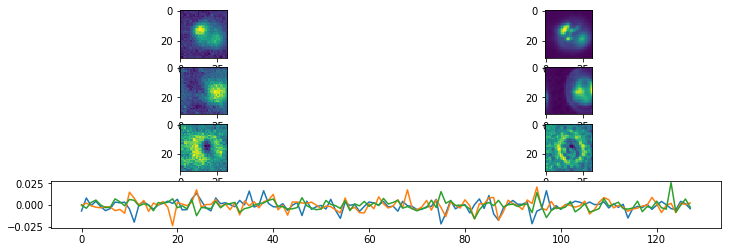

Epoch:  1 Iteration:  800 Loss:  0.334788 0.29573518 0.03905281


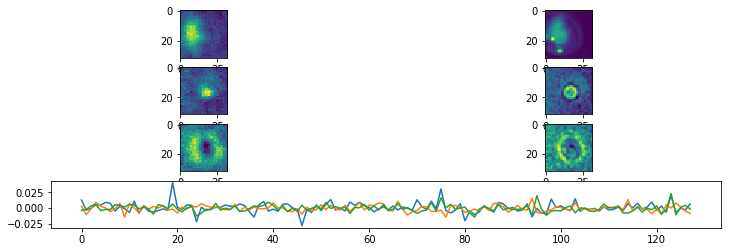

Epoch:  1 Iteration:  1000 Loss:  0.3210773 0.28330117 0.03777611


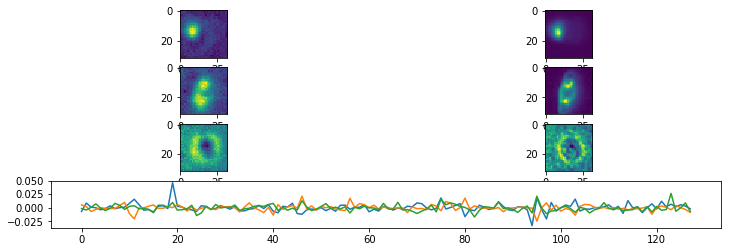

Epoch:  1 Iteration:  1200 Loss:  0.31509653 0.2787134 0.036383133


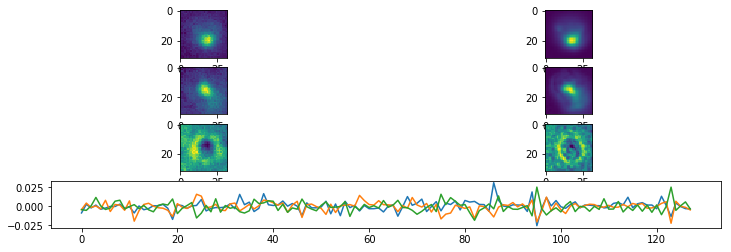

Epoch:  1 Iteration:  1400 Loss:  0.28082567 0.24522653 0.035599146


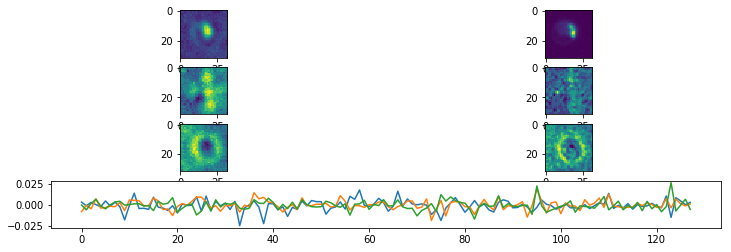

Epoch:  2 Iteration:  0 Loss:  0.30315453 0.26606482 0.037089694


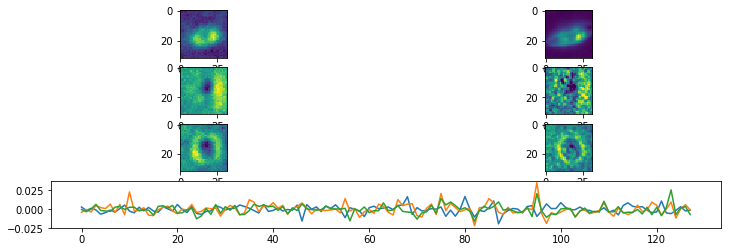

Epoch:  2 Iteration:  200 Loss:  0.28302974 0.24978785 0.03324187


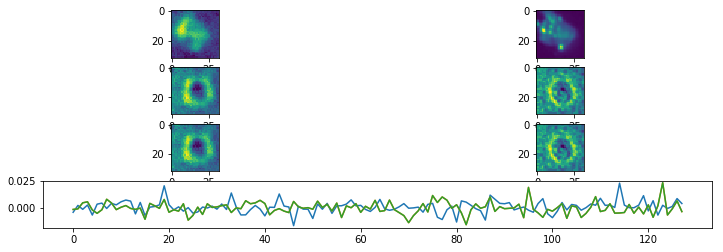

Epoch:  2 Iteration:  400 Loss:  0.26368153 0.23163861 0.032042917


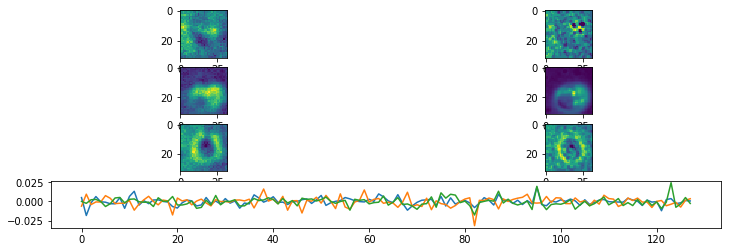

Epoch:  2 Iteration:  600 Loss:  0.26181984 0.23041989 0.031399947


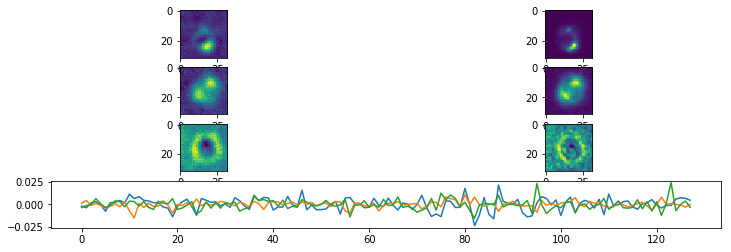

Epoch:  2 Iteration:  800 Loss:  0.24464993 0.21379331 0.03085663


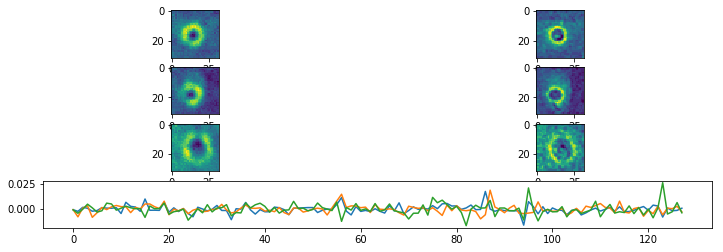

Epoch:  2 Iteration:  1000 Loss:  0.24227405 0.21219853 0.030075513


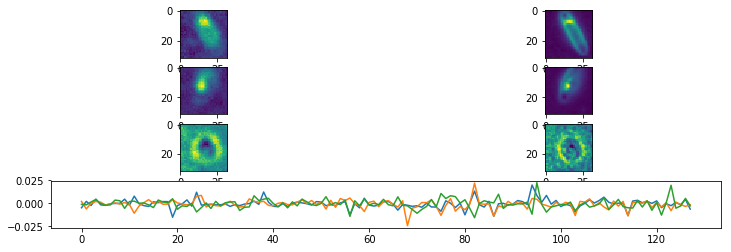

Epoch:  2 Iteration:  1200 Loss:  0.22038437 0.1919432 0.028441176


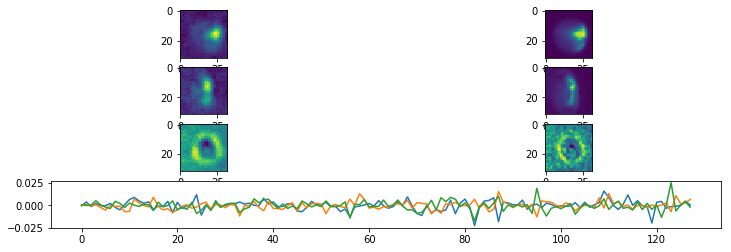

Epoch:  2 Iteration:  1400 Loss:  0.2174151 0.18877801 0.028637081


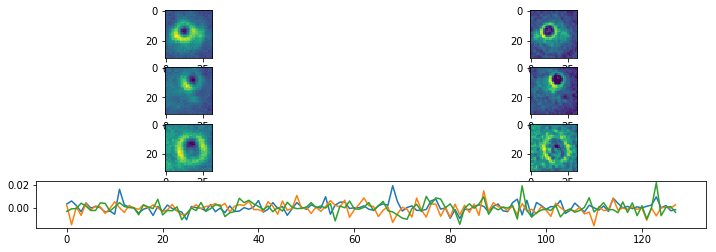

Epoch:  3 Iteration:  0 Loss:  0.22640522 0.19633147 0.03007375


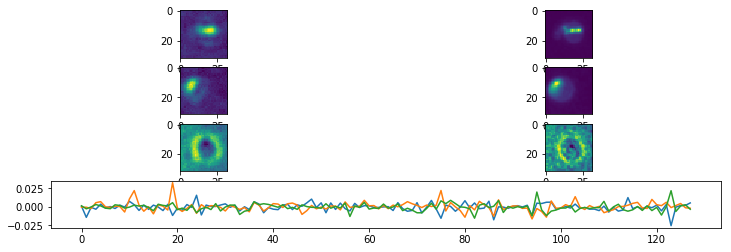

Epoch:  3 Iteration:  200 Loss:  0.2781778 0.25022557 0.02795221


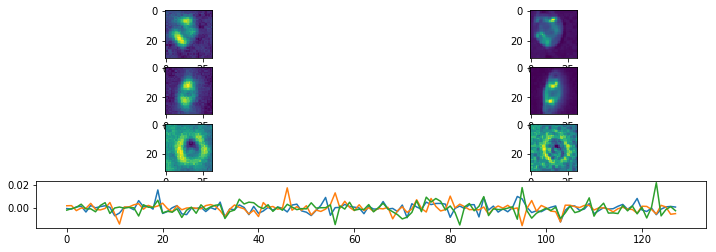

Epoch:  3 Iteration:  400 Loss:  0.20574616 0.17957106 0.026175097


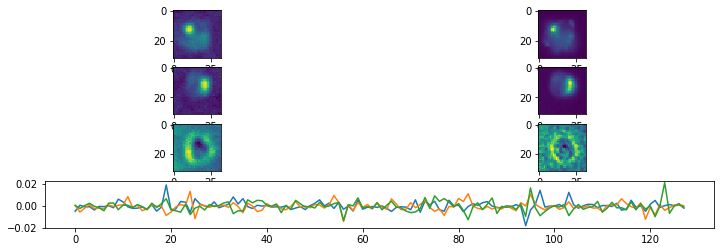

Epoch:  3 Iteration:  600 Loss:  0.19045249 0.16464306 0.025809418


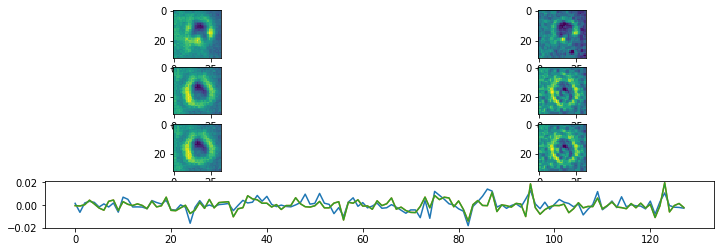

Epoch:  3 Iteration:  800 Loss:  0.19254524 0.16725525 0.02528999


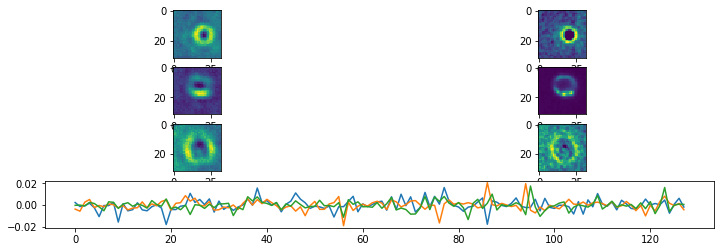

Epoch:  3 Iteration:  1000 Loss:  0.20376748 0.1787943 0.024973176


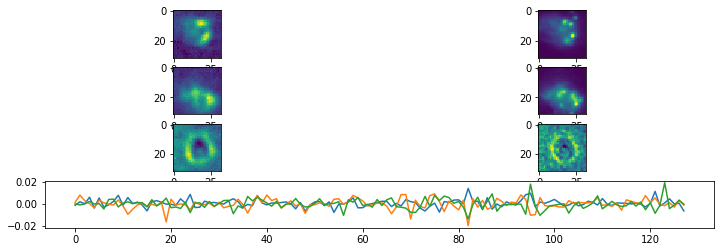

Epoch:  3 Iteration:  1200 Loss:  0.17495044 0.15121916 0.02373127


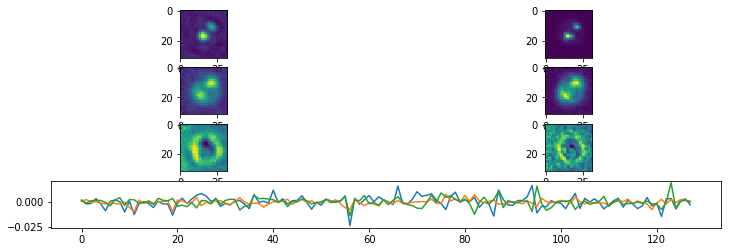

Epoch:  3 Iteration:  1400 Loss:  0.16975333 0.14596355 0.023789775


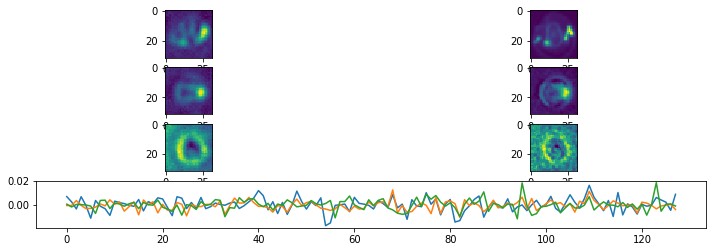

Epoch:  4 Iteration:  0 Loss:  0.19722085 0.17235461 0.024866233


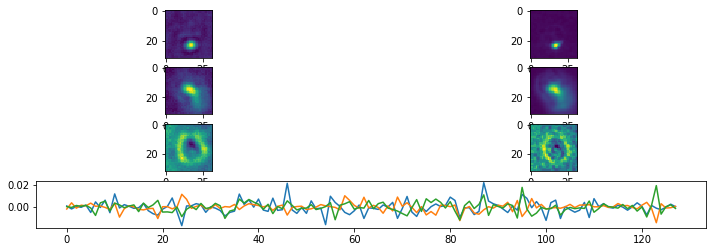

Epoch:  4 Iteration:  200 Loss:  0.1831175 0.16017759 0.022939906


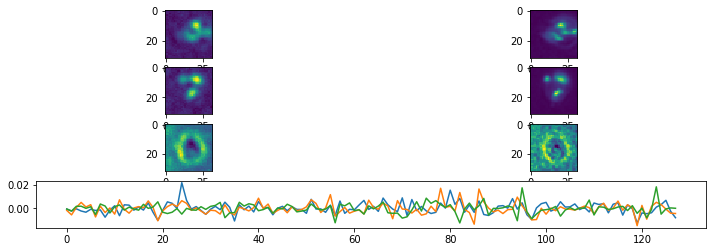

Epoch:  4 Iteration:  400 Loss:  0.17568012 0.15360764 0.022072475


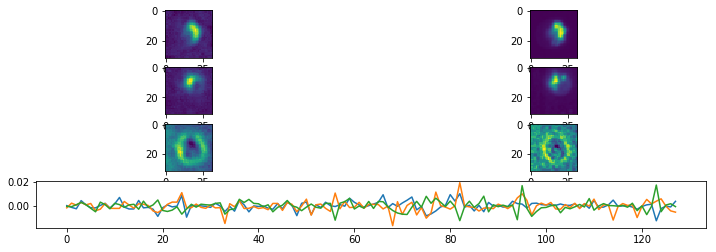

Epoch:  4 Iteration:  600 Loss:  0.16180184 0.13998243 0.02181941


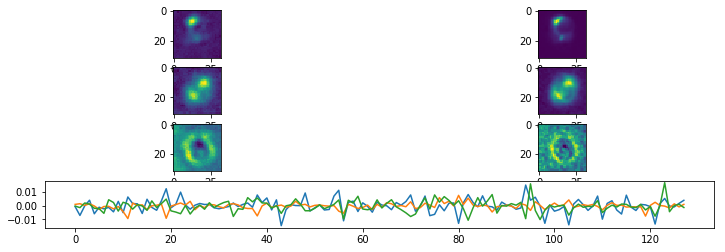

Epoch:  4 Iteration:  800 Loss:  0.16168949 0.14034683 0.021342663


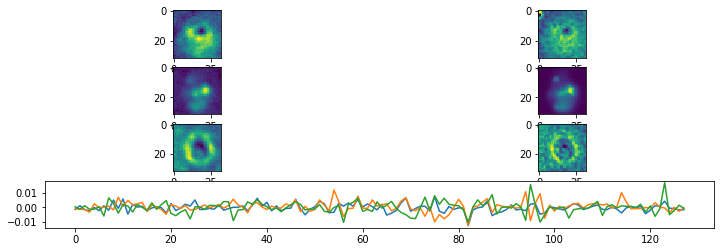

Epoch:  4 Iteration:  1000 Loss:  0.16799156 0.14614335 0.021848222


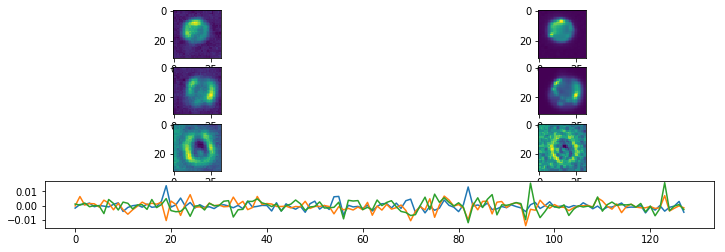

Epoch:  4 Iteration:  1200 Loss:  0.14594768 0.12547258 0.020475103


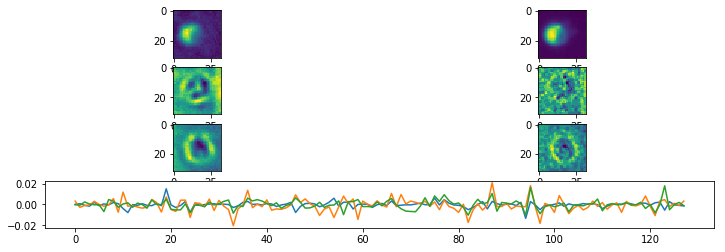

Epoch:  4 Iteration:  1400 Loss:  0.14400683 0.12399334 0.020013498


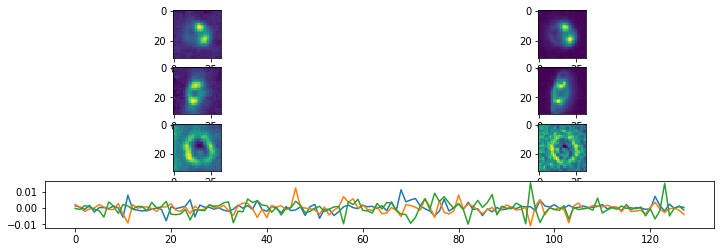

Epoch:  5 Iteration:  0 Loss:  0.15444969 0.13303536 0.021414327


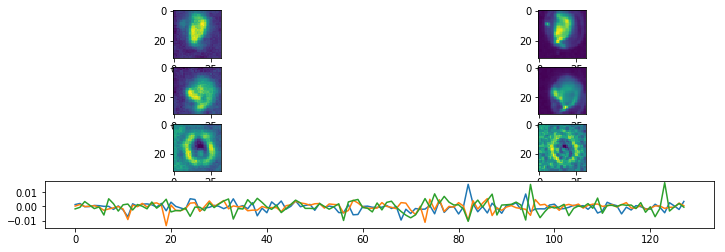

Epoch:  5 Iteration:  200 Loss:  0.16011974 0.13999087 0.020128869


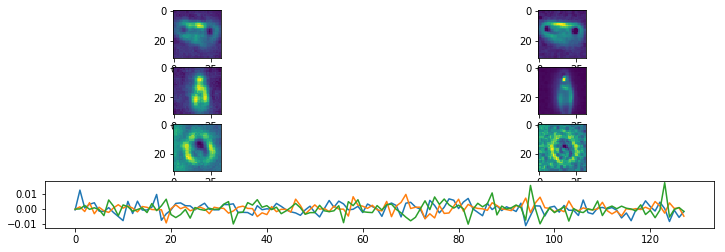

Epoch:  5 Iteration:  400 Loss:  0.14860909 0.12943327 0.019175809


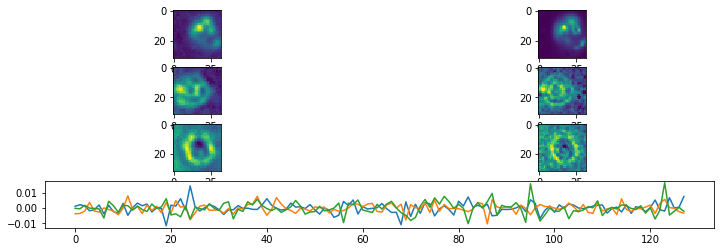

Epoch:  5 Iteration:  600 Loss:  0.15377006 0.13448876 0.01928129


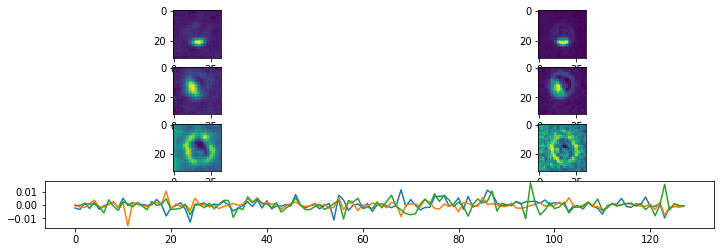

Epoch:  5 Iteration:  800 Loss:  0.13688295 0.11825625 0.018626695


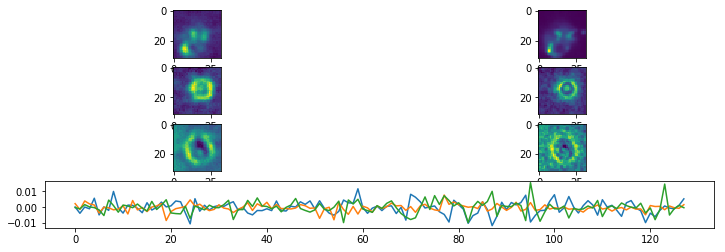

Epoch:  5 Iteration:  1000 Loss:  0.13341162 0.11458787 0.018823747


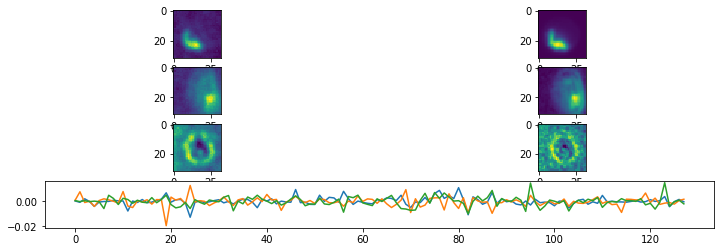

Epoch:  5 Iteration:  1200 Loss:  0.12625854 0.1083435 0.017915035


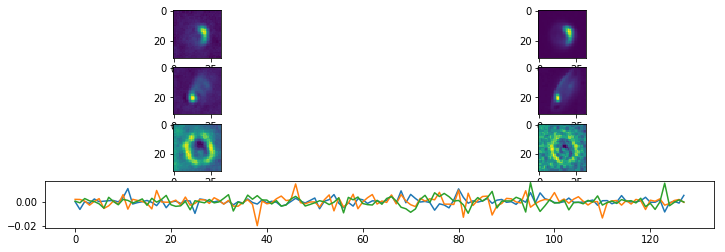

Epoch:  5 Iteration:  1400 Loss:  0.12979943 0.112005934 0.017793493


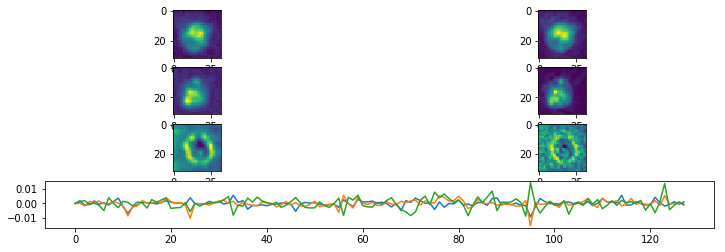

Epoch:  6 Iteration:  0 Loss:  0.13289401 0.114360906 0.018533096


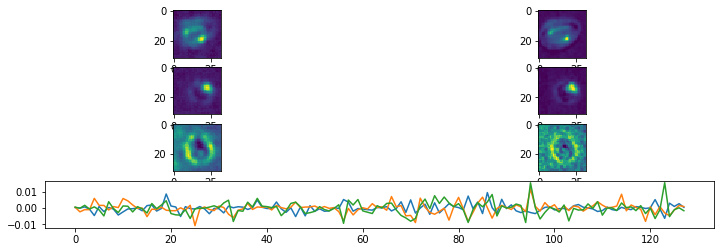

Epoch:  6 Iteration:  200 Loss:  0.1339772 0.11384554 0.02013167


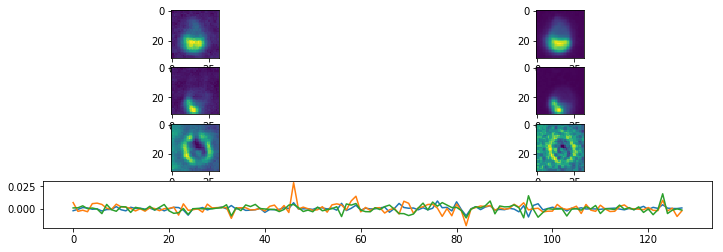

Epoch:  6 Iteration:  400 Loss:  0.12961861 0.111919925 0.017698694


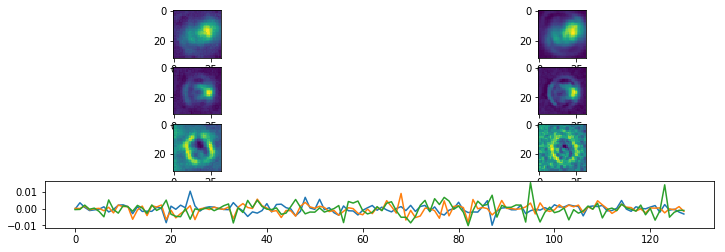

Epoch:  6 Iteration:  600 Loss:  0.11966665 0.10257495 0.017091699


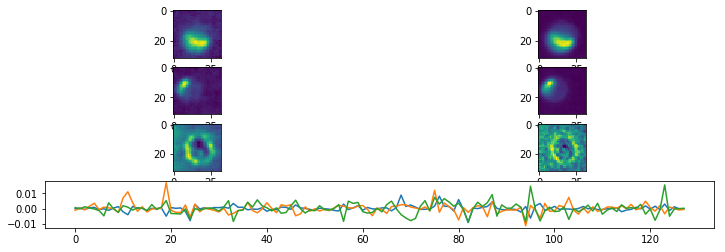

Epoch:  6 Iteration:  800 Loss:  0.120046824 0.103351444 0.016695378


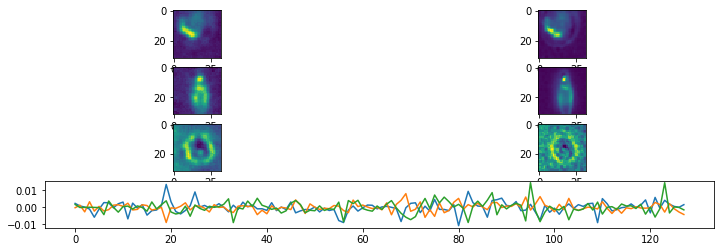

Epoch:  6 Iteration:  1000 Loss:  0.11680981 0.100003615 0.01680619


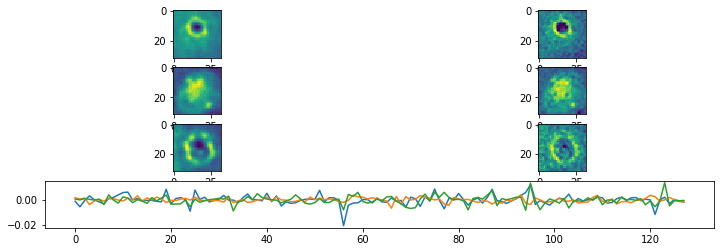

Epoch:  6 Iteration:  1200 Loss:  0.116430365 0.10020384 0.016226524


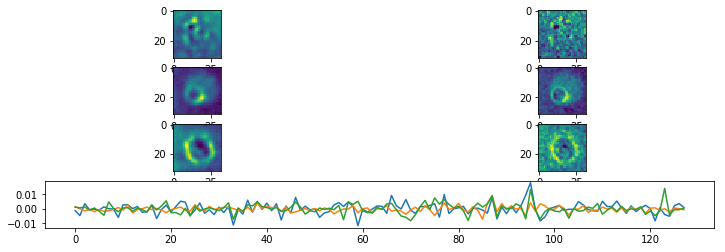

Epoch:  6 Iteration:  1400 Loss:  0.11391905 0.09743193 0.016487125


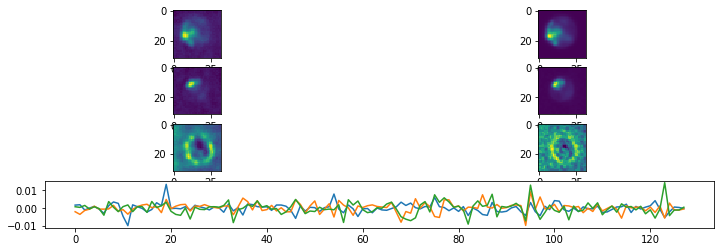

Epoch:  7 Iteration:  0 Loss:  0.1193189 0.10243362 0.016885284


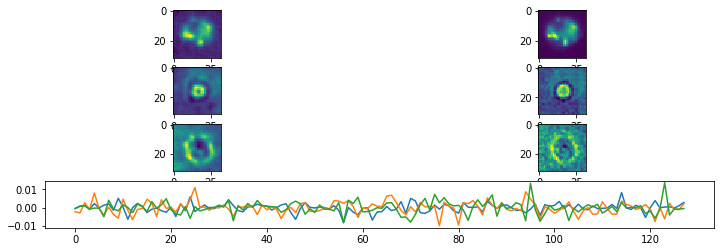

Epoch:  7 Iteration:  200 Loss:  0.121615894 0.105862394 0.015753498


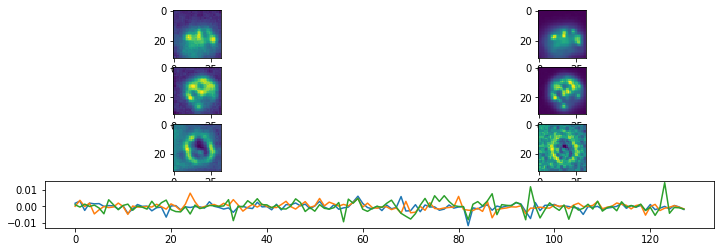

Epoch:  7 Iteration:  400 Loss:  0.17146277 0.1306836 0.040779177


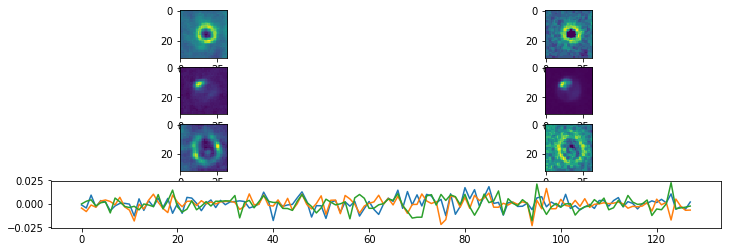

Epoch:  7 Iteration:  600 Loss:  0.1315341 0.10408233 0.027451765


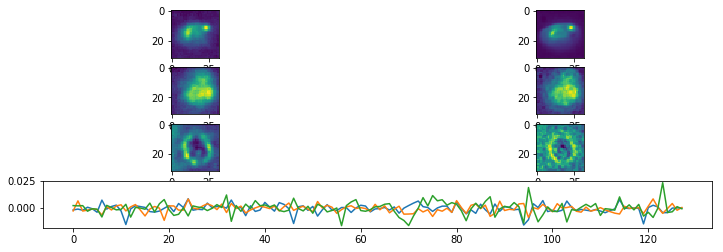

Epoch:  7 Iteration:  800 Loss:  0.124029145 0.10076259 0.023266554


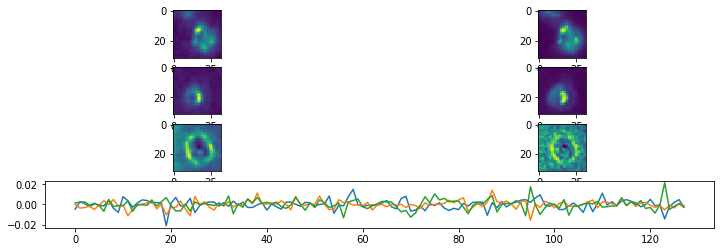

Epoch:  7 Iteration:  1000 Loss:  0.11533158 0.09439129 0.020940296


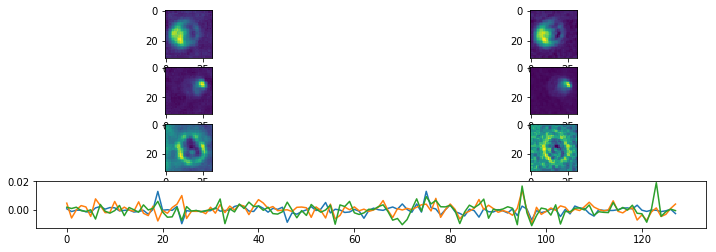

Epoch:  7 Iteration:  1200 Loss:  0.15729173 0.138825 0.018466722


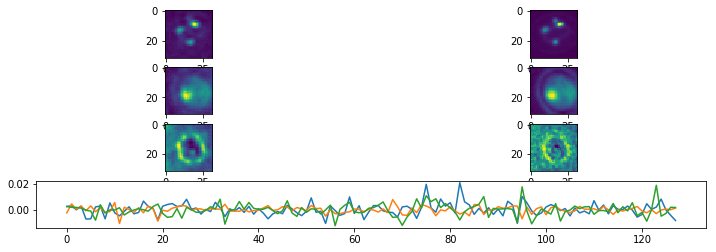

Epoch:  7 Iteration:  1400 Loss:  0.10518862 0.08719346 0.01799516


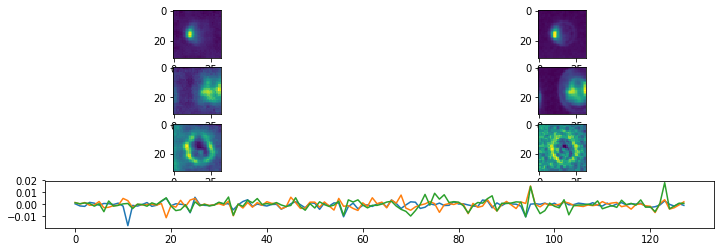

Epoch:  8 Iteration:  0 Loss:  0.112947755 0.09450537 0.018442387


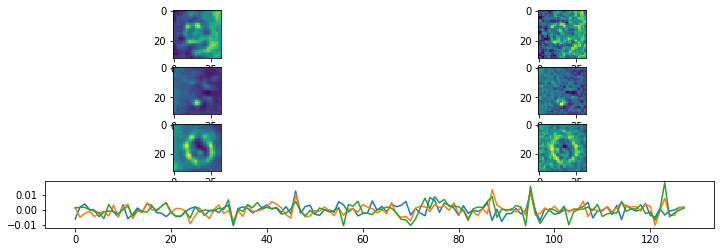

Epoch:  8 Iteration:  200 Loss:  0.13867028 0.121002525 0.017667752


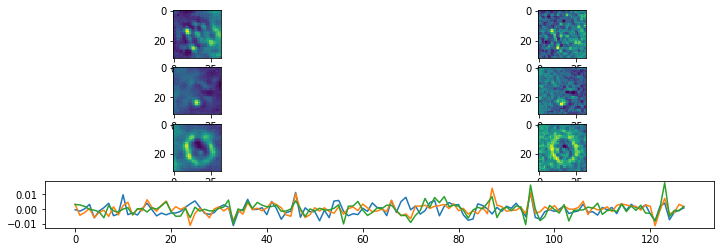

Epoch:  8 Iteration:  400 Loss:  0.1113974 0.09540267 0.01599473


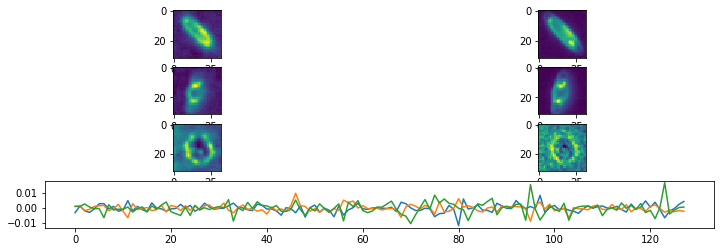

Epoch:  8 Iteration:  600 Loss:  0.10058032 0.08489244 0.01568788


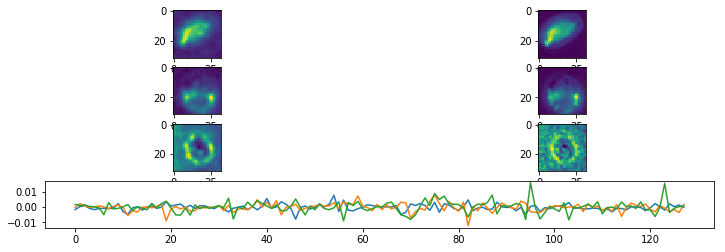

Epoch:  8 Iteration:  800 Loss:  0.10595636 0.09069765 0.015258711


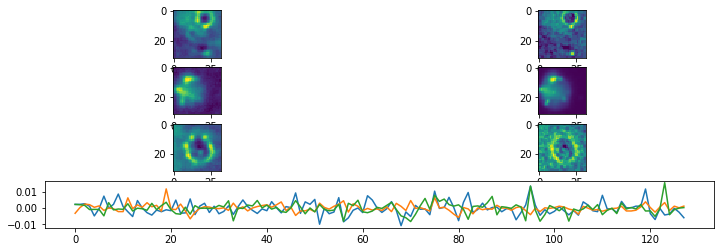

Epoch:  8 Iteration:  1000 Loss:  0.10224098 0.08669647 0.015544511


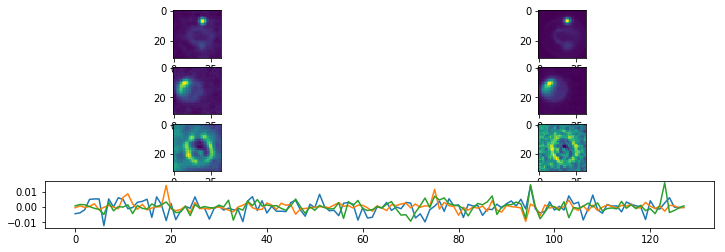

Epoch:  8 Iteration:  1200 Loss:  0.09380436 0.07952629 0.014278066


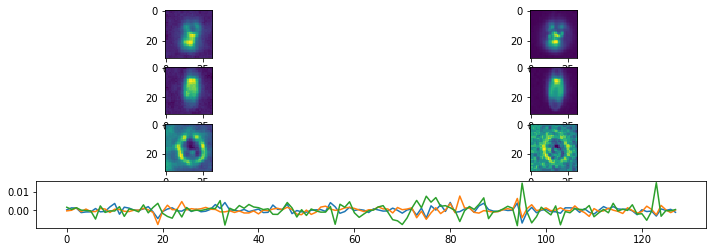

Epoch:  8 Iteration:  1400 Loss:  0.09698882 0.08235655 0.014632272


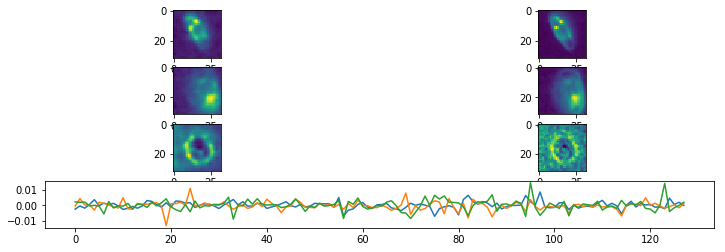

Epoch:  9 Iteration:  0 Loss:  0.10059209 0.08534739 0.015244699


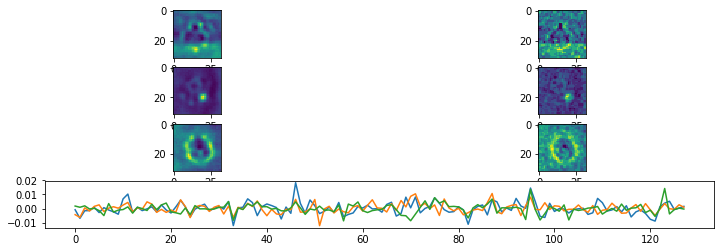

Epoch:  9 Iteration:  200 Loss:  0.11135478 0.096734345 0.014620436


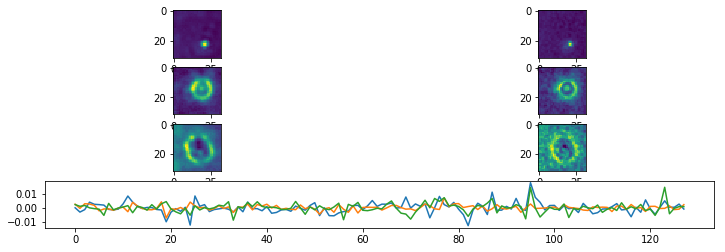

Epoch:  9 Iteration:  400 Loss:  0.10552907 0.091556944 0.013972128


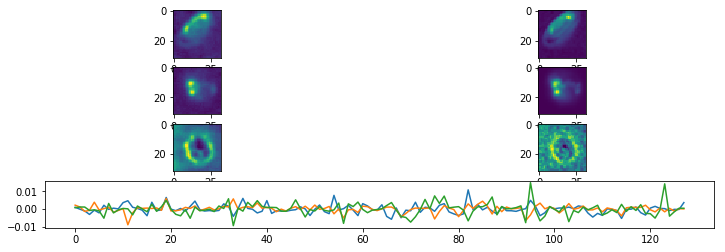

Epoch:  9 Iteration:  600 Loss:  0.09982467 0.0860447 0.013779972


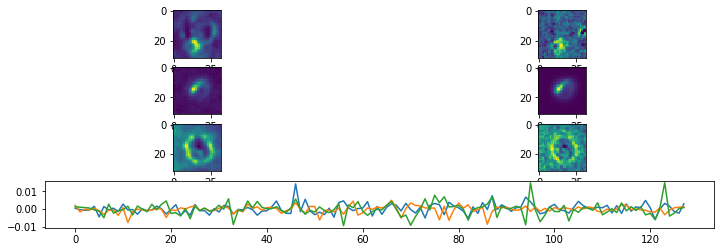

Epoch:  9 Iteration:  800 Loss:  0.09813204 0.08432376 0.013808277


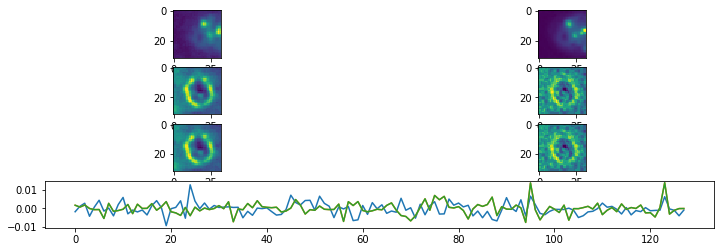

Epoch:  9 Iteration:  1000 Loss:  0.095242694 0.08104409 0.014198598


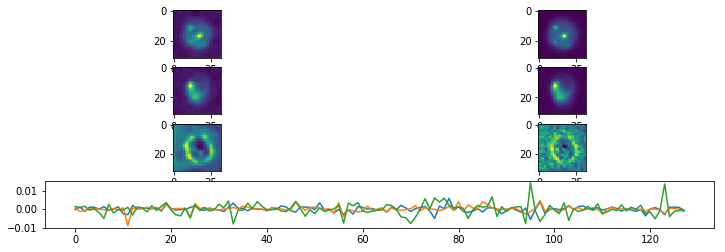

Epoch:  9 Iteration:  1200 Loss:  0.09682347 0.083359405 0.013464064


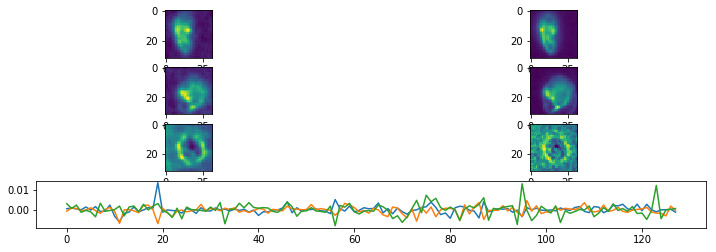

Epoch:  9 Iteration:  1400 Loss:  0.09047683 0.07701652 0.013460319


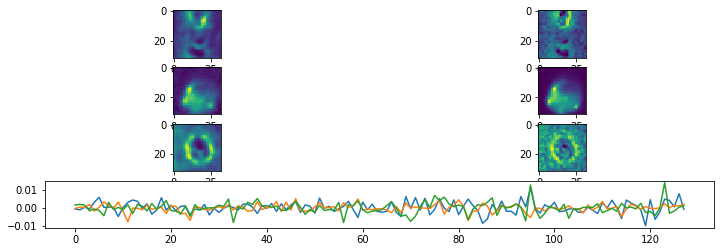

Epoch:  10 Iteration:  0 Loss:  0.09308118 0.07911804 0.013963133


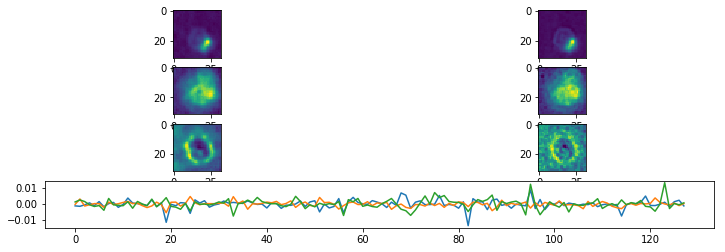

Epoch:  10 Iteration:  200 Loss:  0.098186925 0.08482105 0.013365874


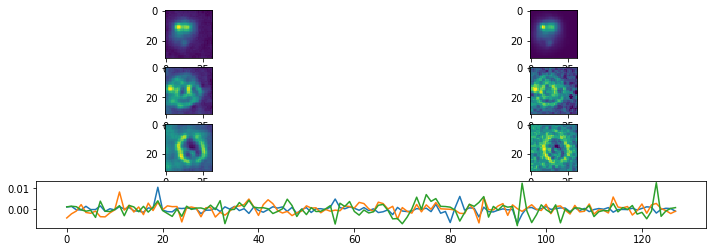

Epoch:  10 Iteration:  400 Loss:  0.0952999 0.082166664 0.0131332325


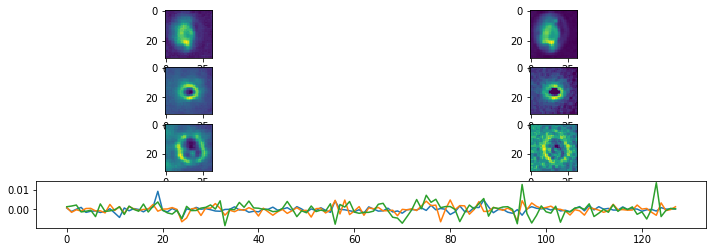

Epoch:  10 Iteration:  600 Loss:  0.19259515 0.14168873 0.050906427


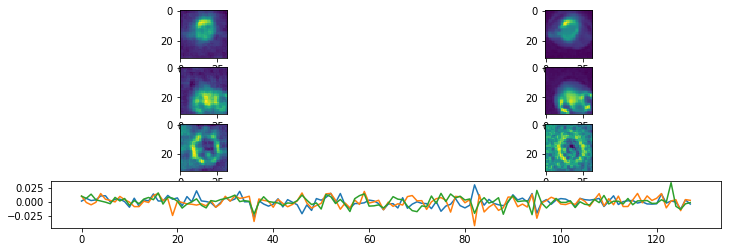

Epoch:  10 Iteration:  800 Loss:  0.12850997 0.095711105 0.032798868


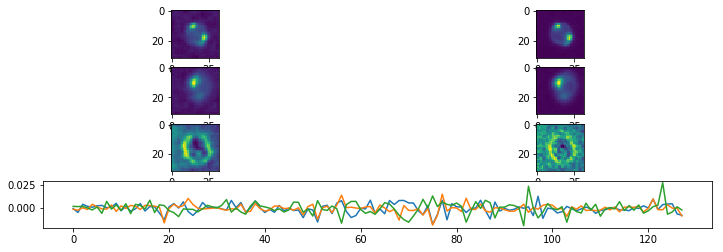

Epoch:  10 Iteration:  1000 Loss:  0.114528924 0.08733606 0.027192857


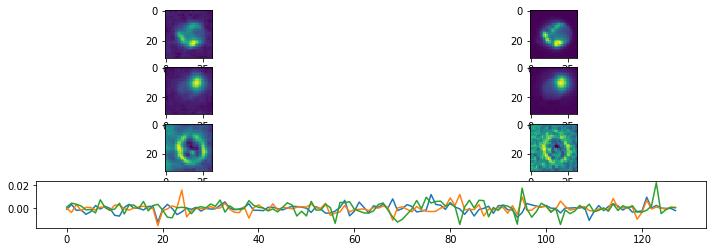

Epoch:  10 Iteration:  1200 Loss:  0.11811217 0.09518495 0.022927217


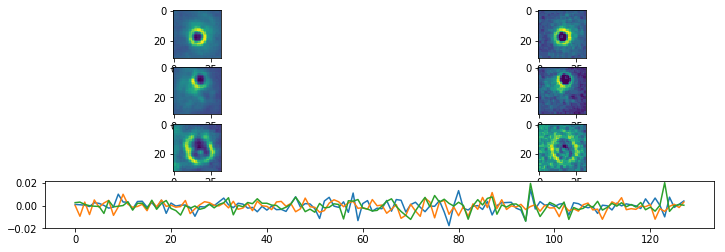

Epoch:  10 Iteration:  1400 Loss:  0.098408975 0.07796728 0.020441698


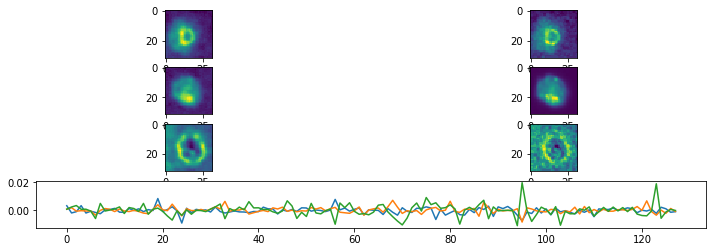

Epoch:  11 Iteration:  0 Loss:  0.10246043 0.080865905 0.021594524


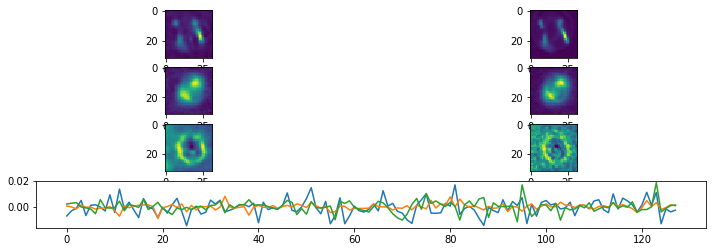

Epoch:  11 Iteration:  200 Loss:  0.112748206 0.09329592 0.019452287


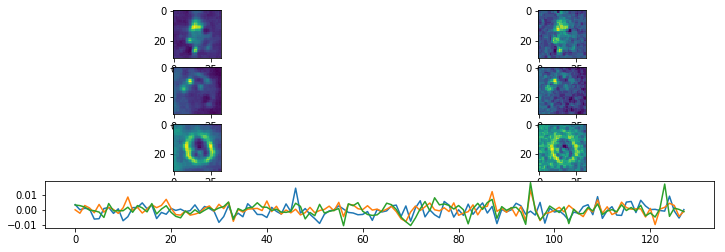

Epoch:  11 Iteration:  400 Loss:  0.10568126 0.087791085 0.017890178


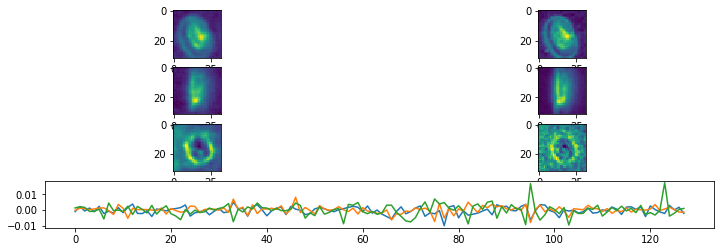

Epoch:  11 Iteration:  600 Loss:  0.09208885 0.075369835 0.016719017


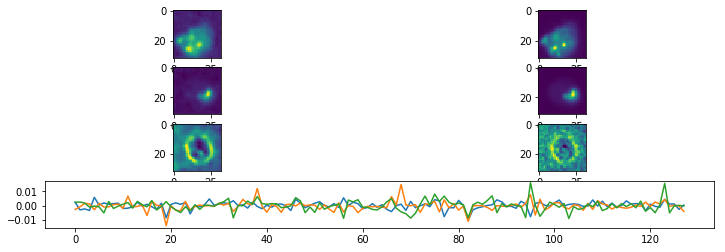

Epoch:  11 Iteration:  800 Loss:  0.09457564 0.07849563 0.016080018


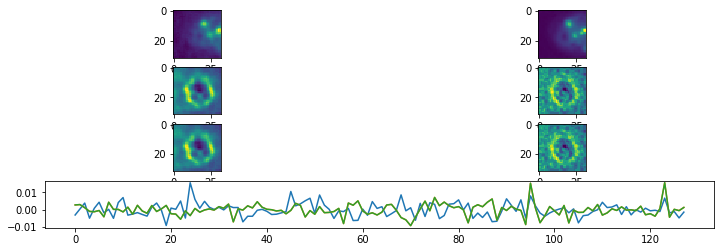

Epoch:  11 Iteration:  1000 Loss:  0.09649535 0.07994212 0.016553229


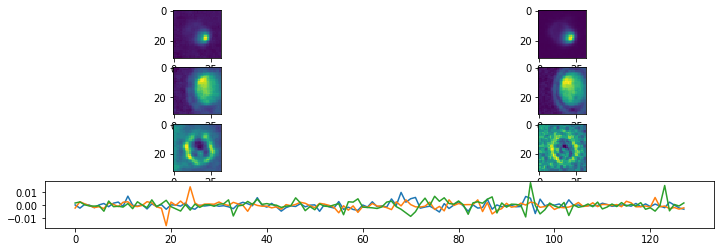

Epoch:  11 Iteration:  1200 Loss:  0.09339306 0.07850871 0.014884342


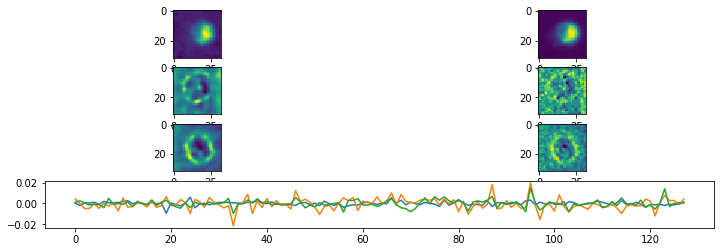

Epoch:  11 Iteration:  1400 Loss:  0.09043898 0.07516143 0.015277549


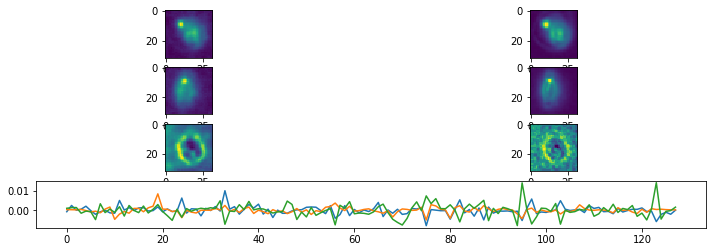

Epoch:  12 Iteration:  0 Loss:  0.090494625 0.07480581 0.015688812


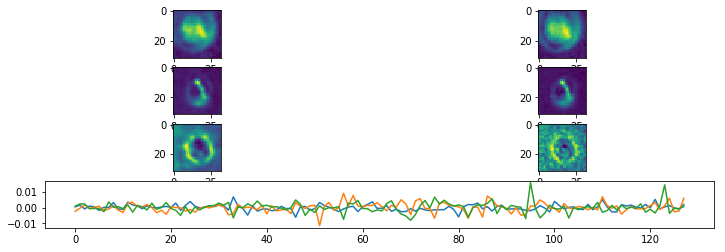

Epoch:  12 Iteration:  200 Loss:  0.10103581 0.08628127 0.014754542


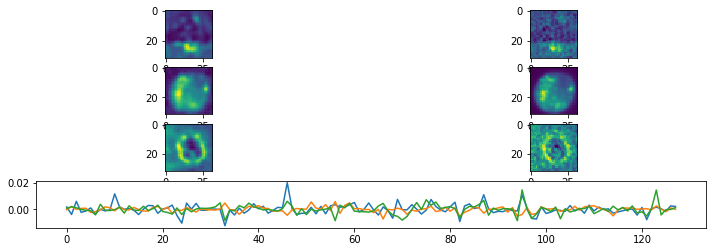

Epoch:  12 Iteration:  400 Loss:  0.10168604 0.087387204 0.014298835


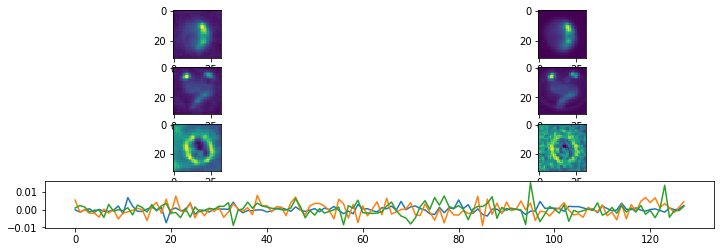

Epoch:  12 Iteration:  600 Loss:  0.0850016 0.07121964 0.013781963


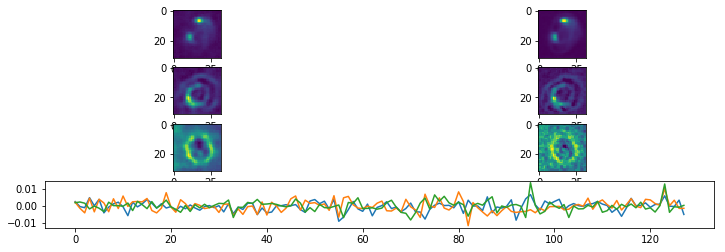

Epoch:  12 Iteration:  800 Loss:  0.094637044 0.08067702 0.013960028


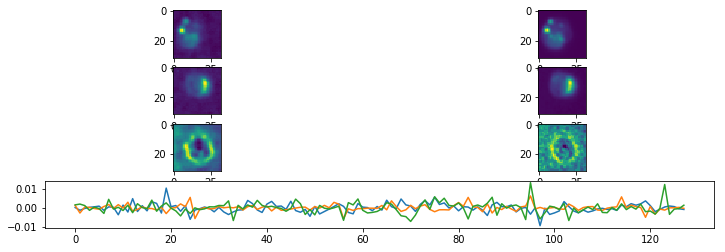

Epoch:  12 Iteration:  1000 Loss:  0.08729708 0.07334085 0.013956236


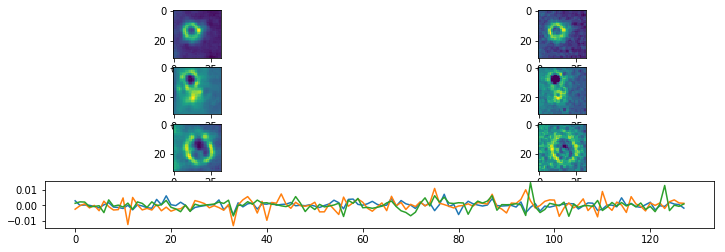

Epoch:  12 Iteration:  1200 Loss:  0.0872391 0.074398756 0.012840348


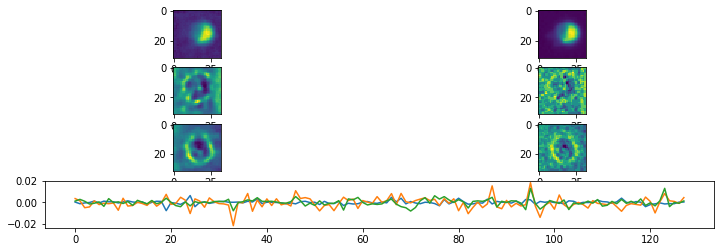

Epoch:  12 Iteration:  1400 Loss:  0.082972765 0.06962547 0.013347298


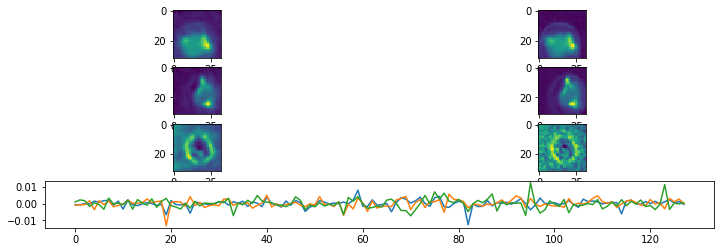

Epoch:  13 Iteration:  0 Loss:  0.08463531 0.0705984 0.014036912


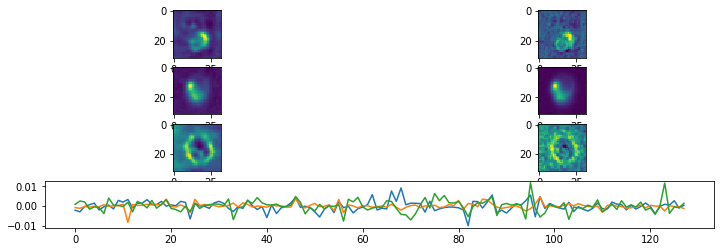

Epoch:  13 Iteration:  200 Loss:  0.104767226 0.09235964 0.012407583


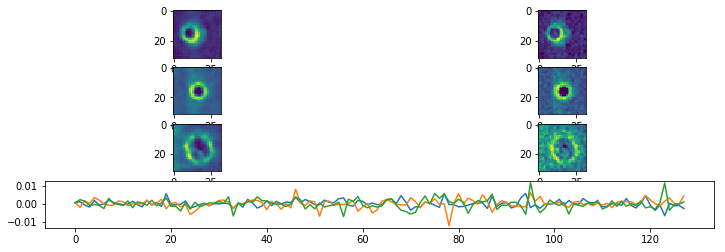

Epoch:  13 Iteration:  400 Loss:  0.09179258 0.07881535 0.012977239


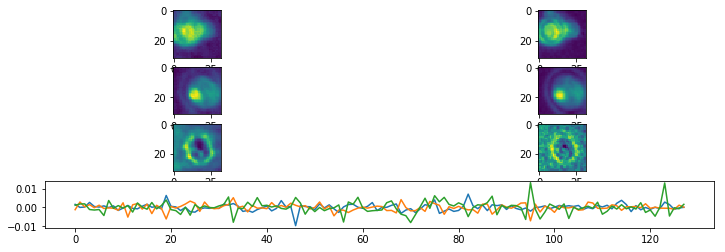

Epoch:  13 Iteration:  600 Loss:  0.0817157 0.06916939 0.012546316


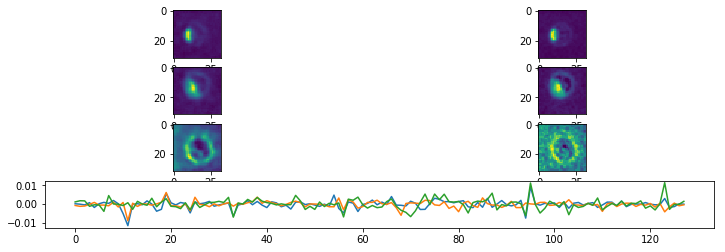

Epoch:  13 Iteration:  800 Loss:  0.08753927 0.07388696 0.013652312


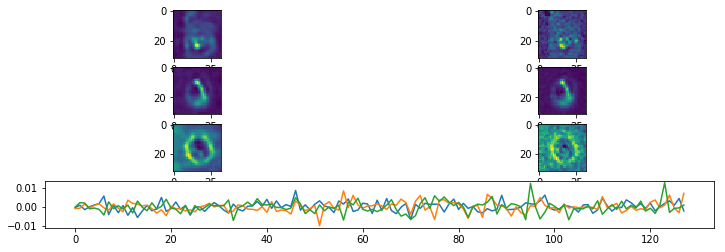

Epoch:  13 Iteration:  1000 Loss:  0.08270943 0.06988146 0.012827973


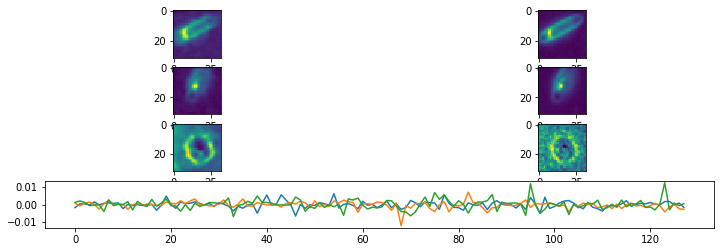

Epoch:  13 Iteration:  1200 Loss:  0.07931167 0.06716471 0.0121469535


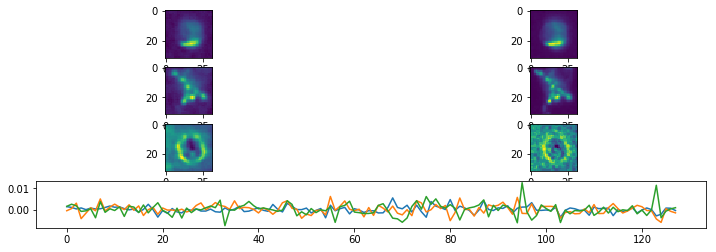

Epoch:  13 Iteration:  1400 Loss:  0.08739287 0.07409176 0.013301108


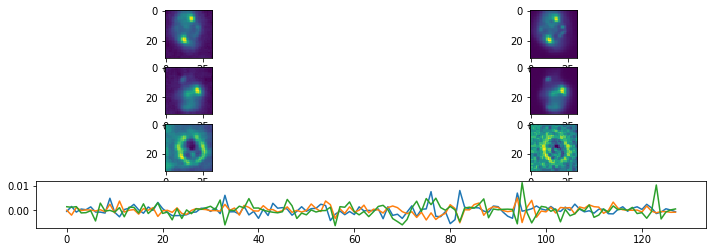

Epoch:  14 Iteration:  0 Loss:  0.081728205 0.06904865 0.012679557


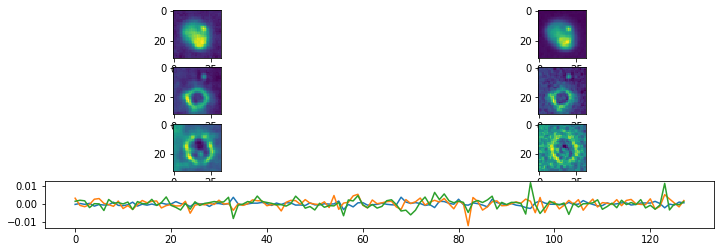

Epoch:  14 Iteration:  200 Loss:  0.087490685 0.07546624 0.012024445


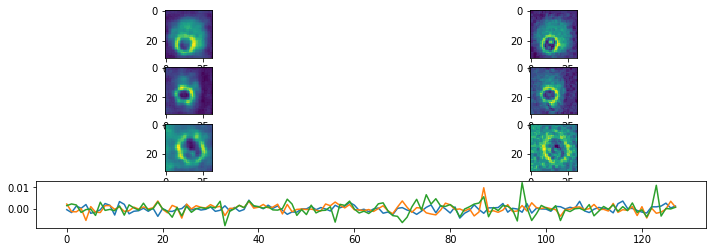

Epoch:  14 Iteration:  400 Loss:  0.090145685 0.07753256 0.012613127


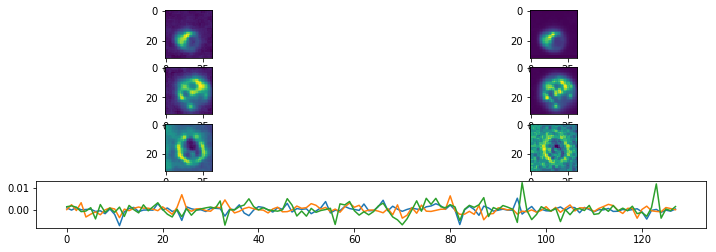

Epoch:  14 Iteration:  600 Loss:  0.08466271 0.07285498 0.011807733


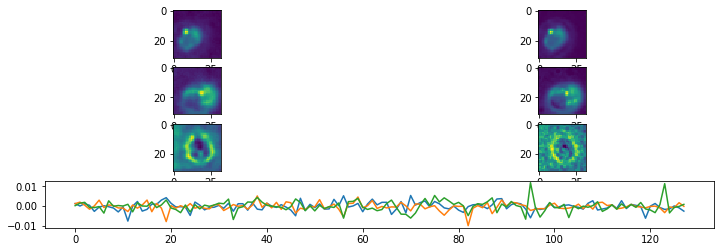

Epoch:  14 Iteration:  800 Loss:  0.08094071 0.06929115 0.011649557


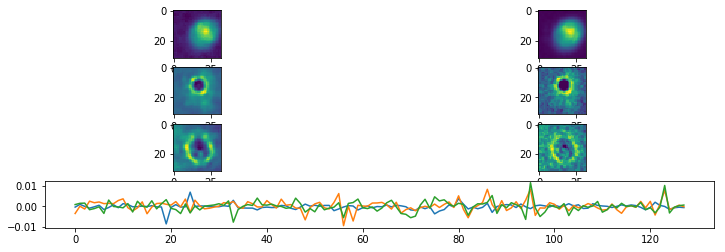

Epoch:  14 Iteration:  1000 Loss:  0.108029366 0.08130398 0.026725389


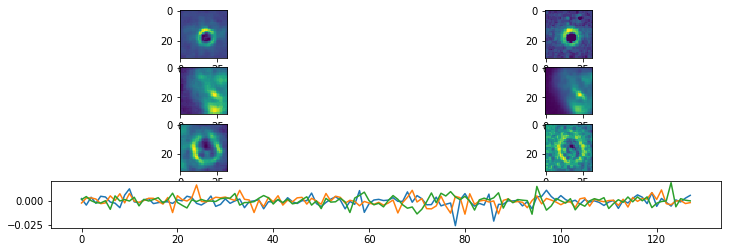

Epoch:  14 Iteration:  1200 Loss:  0.09074281 0.07184309 0.01889972


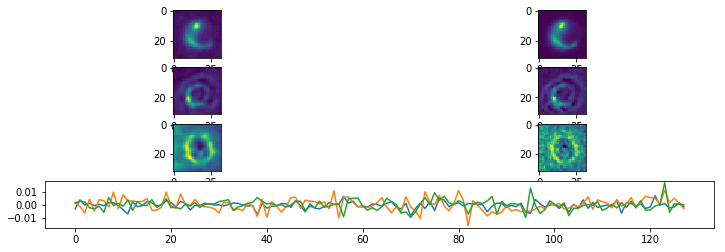

Epoch:  14 Iteration:  1400 Loss:  0.08444801 0.06859284 0.015855169


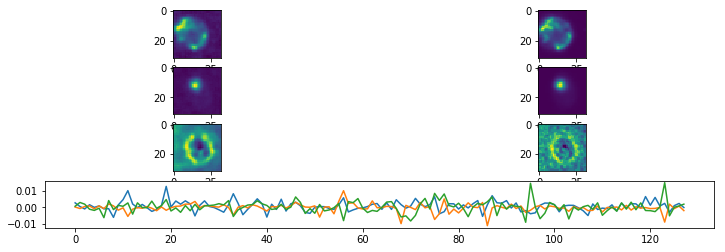

Epoch:  15 Iteration:  0 Loss:  0.08679034 0.070200406 0.016589936


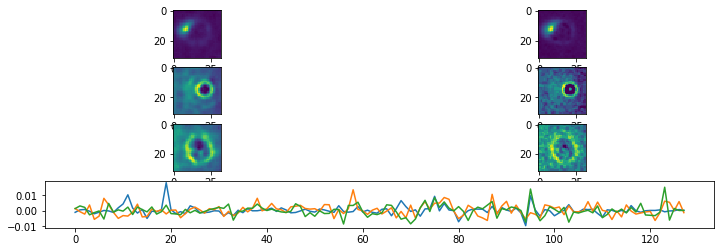

Epoch:  15 Iteration:  200 Loss:  0.08997208 0.07531081 0.014661269


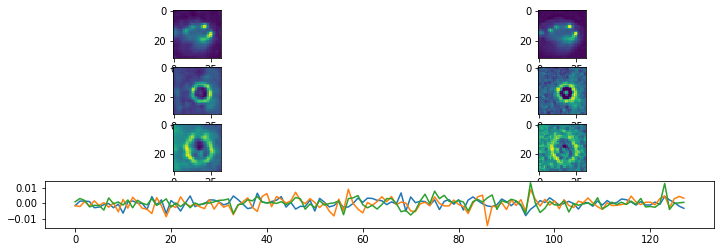

Epoch:  15 Iteration:  400 Loss:  0.08580889 0.07229493 0.013513959


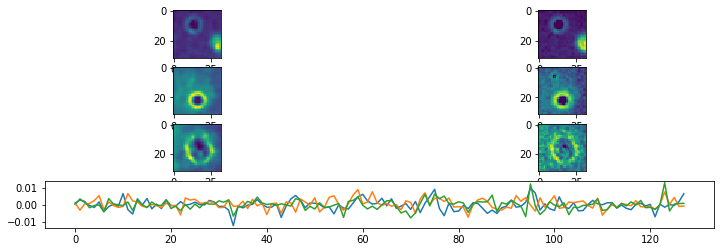

Epoch:  15 Iteration:  600 Loss:  0.07885874 0.06607666 0.012782082


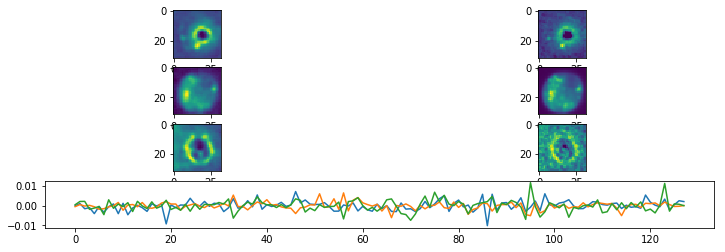

Epoch:  15 Iteration:  800 Loss:  0.08256836 0.07022382 0.012344535


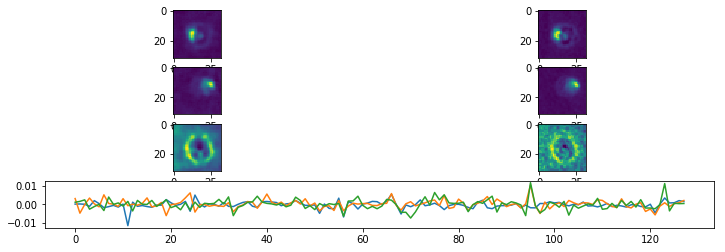

Epoch:  15 Iteration:  1000 Loss:  0.0794038 0.06682433 0.012579468


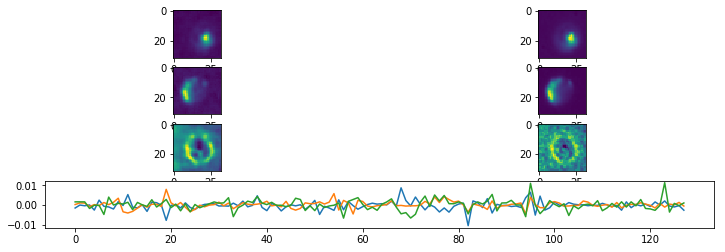

Epoch:  15 Iteration:  1200 Loss:  0.08769092 0.07607192 0.011618998


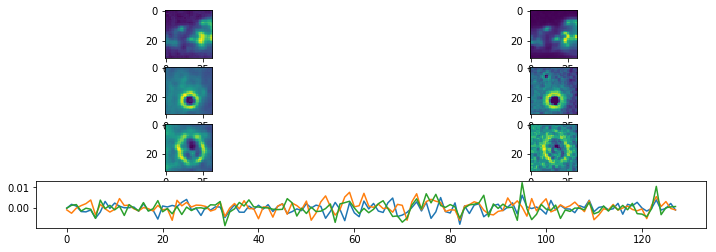

Epoch:  15 Iteration:  1400 Loss:  0.07431366 0.06290017 0.0114134895


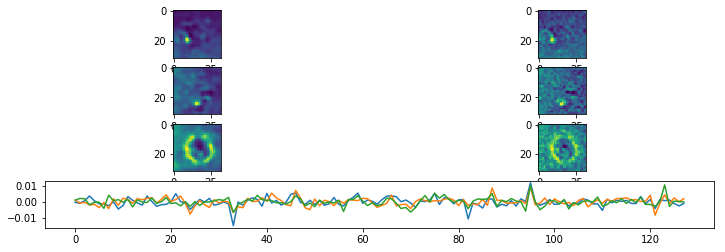

Epoch:  16 Iteration:  0 Loss:  0.07716342 0.065004066 0.012159356


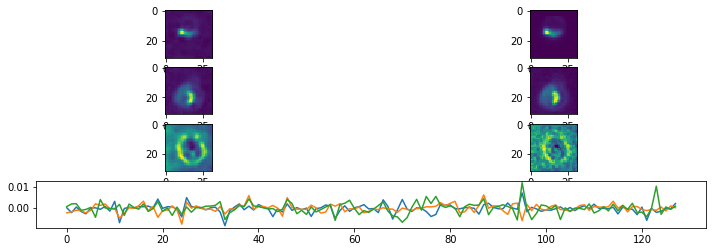

Epoch:  16 Iteration:  200 Loss:  0.08350569 0.07159769 0.011908001


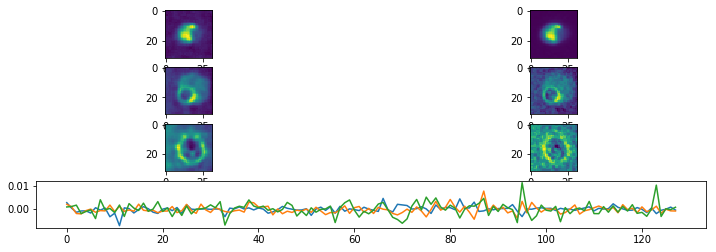

Epoch:  16 Iteration:  400 Loss:  0.08047383 0.06888225 0.0115915835


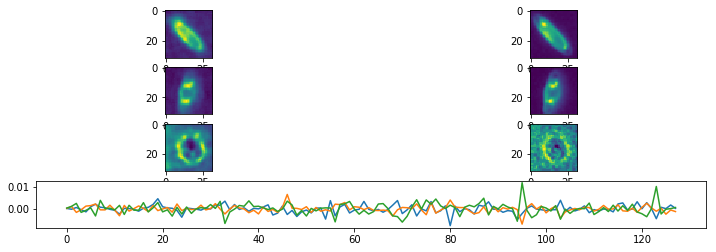

Epoch:  16 Iteration:  600 Loss:  0.094603434 0.08310635 0.0114970915


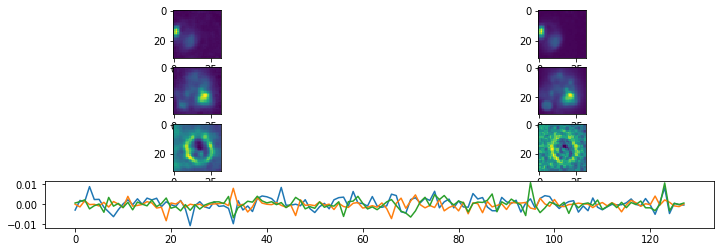

Epoch:  16 Iteration:  800 Loss:  0.0789428 0.06779589 0.011146909


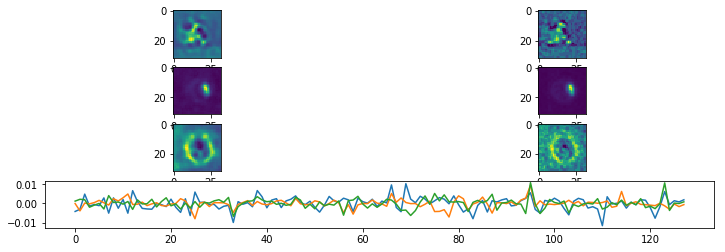

Epoch:  16 Iteration:  1000 Loss:  0.078241915 0.0665285 0.011713419


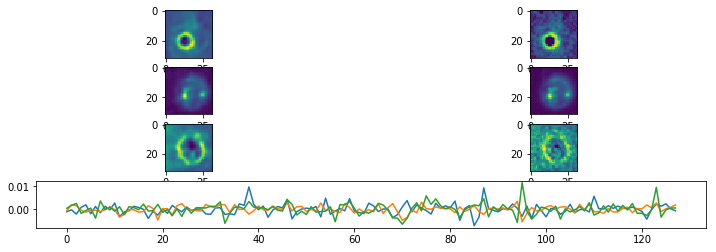

Epoch:  16 Iteration:  1200 Loss:  0.07410559 0.06324932 0.010856273


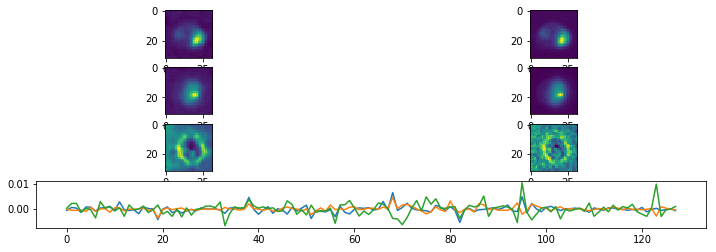

Epoch:  16 Iteration:  1400 Loss:  0.07395039 0.06286707 0.011083319


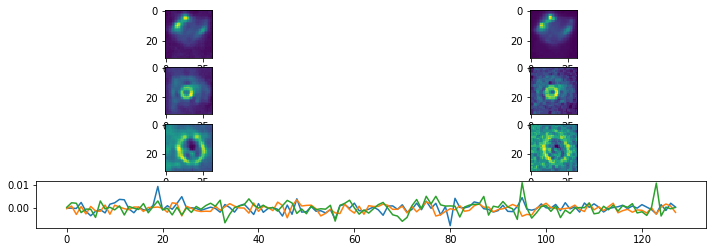

Epoch:  17 Iteration:  0 Loss:  0.075890295 0.0646533 0.011236993


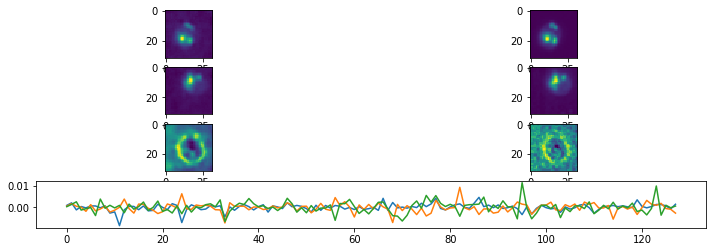

Epoch:  17 Iteration:  200 Loss:  0.08417051 0.0727135 0.011457011


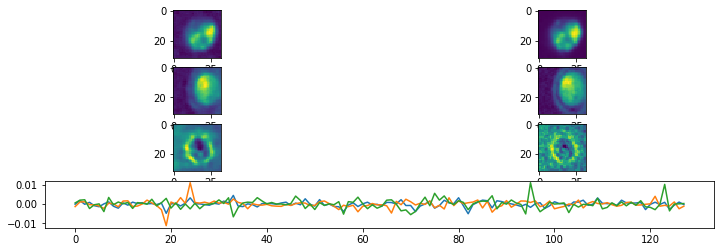

Epoch:  17 Iteration:  400 Loss:  0.07892181 0.066509195 0.012412613


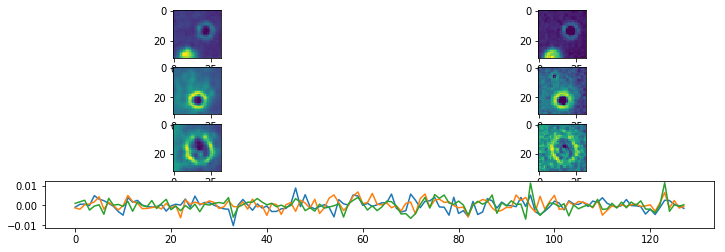

Epoch:  17 Iteration:  600 Loss:  0.0807161 0.069922835 0.010793267


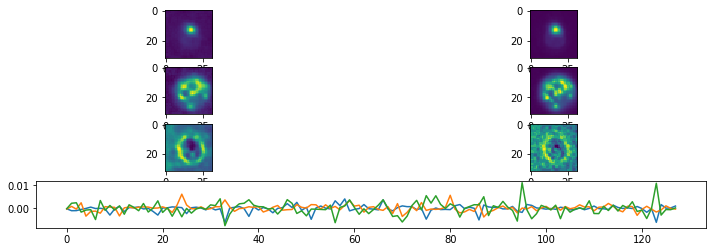

Epoch:  17 Iteration:  800 Loss:  0.075786725 0.06479481 0.010991914


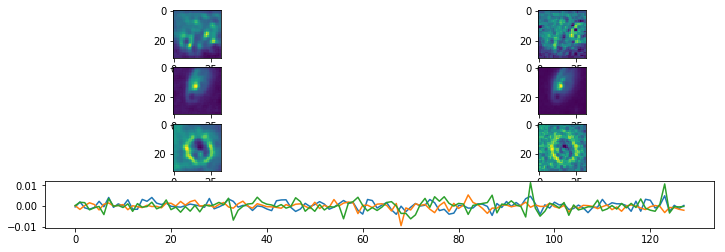

Epoch:  17 Iteration:  1000 Loss:  0.07760126 0.06674445 0.010856814


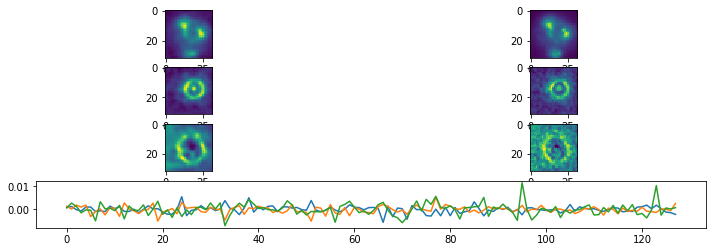

Epoch:  17 Iteration:  1200 Loss:  0.09715004 0.073371544 0.023778494


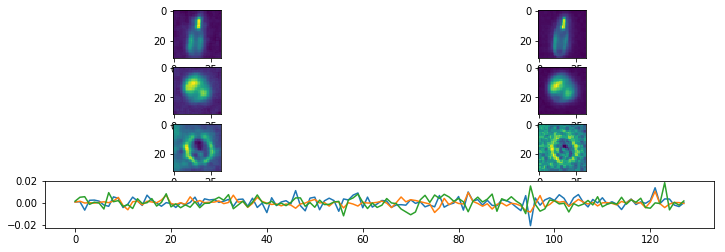

Epoch:  17 Iteration:  1400 Loss:  0.07811641 0.061912786 0.016203623


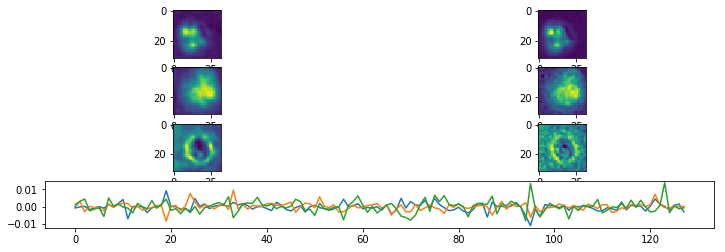

Epoch:  18 Iteration:  0 Loss:  0.08131884 0.064550966 0.016767872


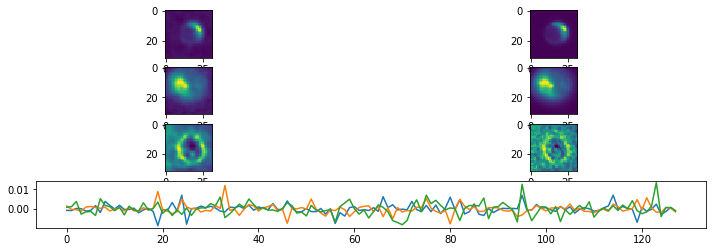

Epoch:  18 Iteration:  200 Loss:  0.086395085 0.07278993 0.013605159


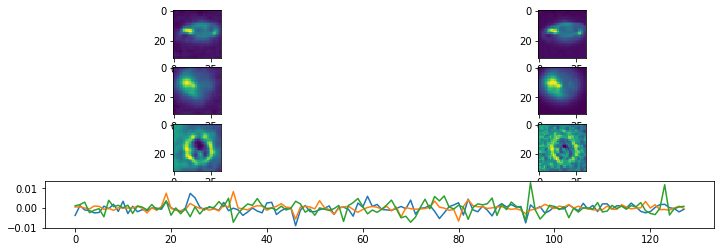

Epoch:  18 Iteration:  400 Loss:  0.08055049 0.068335764 0.012214726


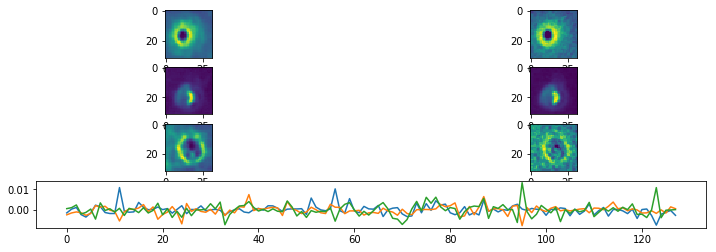

Epoch:  18 Iteration:  600 Loss:  0.080019996 0.06857205 0.011447942


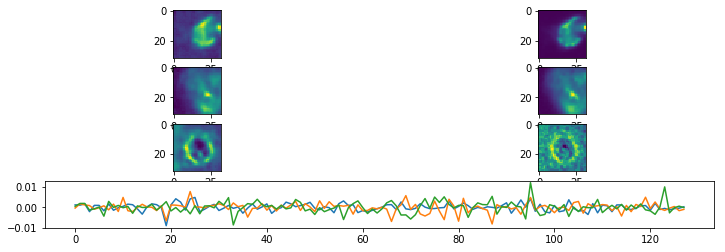

Epoch:  18 Iteration:  800 Loss:  0.07586679 0.06454692 0.011319866


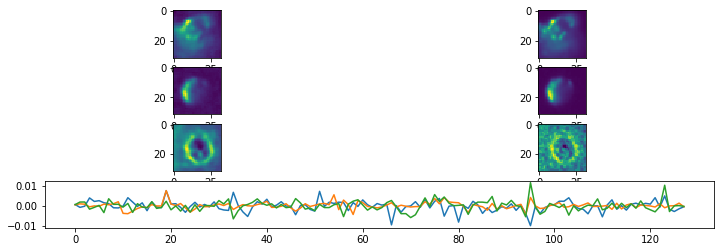

Epoch:  18 Iteration:  1000 Loss:  0.07273641 0.061568603 0.011167813


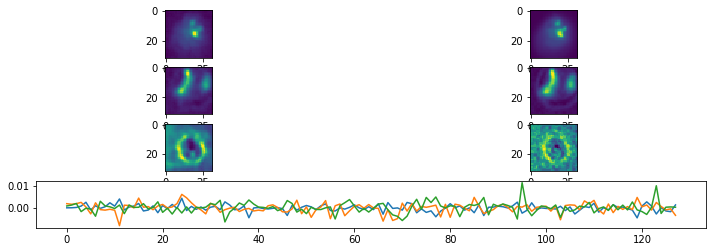

Epoch:  18 Iteration:  1200 Loss:  0.08148833 0.07068606 0.010802277


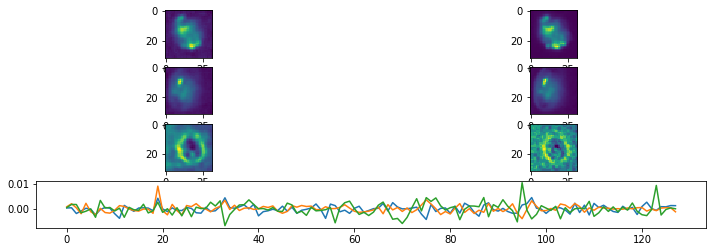

Epoch:  18 Iteration:  1400 Loss:  0.06984574 0.059143327 0.010702416


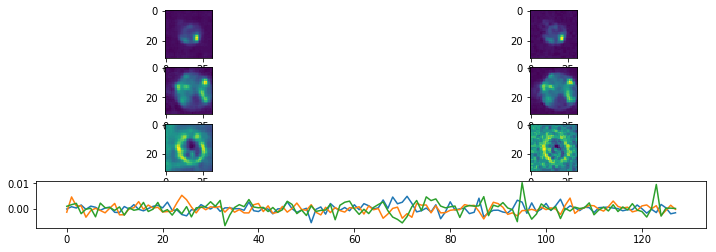

Epoch:  19 Iteration:  0 Loss:  0.078009136 0.06700531 0.011003831


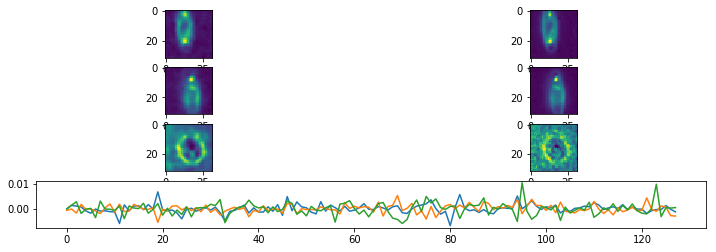

Epoch:  19 Iteration:  200 Loss:  0.08113939 0.07061369 0.010525706


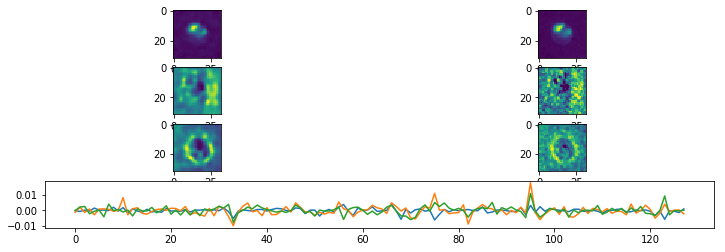

Epoch:  19 Iteration:  400 Loss:  0.074043855 0.063469365 0.010574494


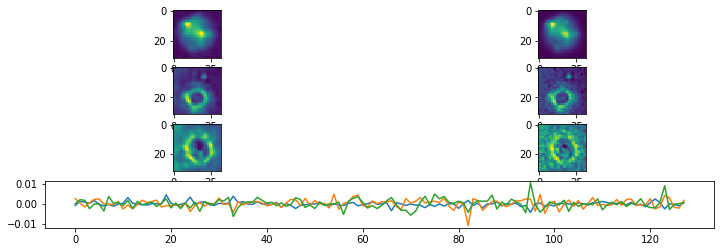

Epoch:  19 Iteration:  600 Loss:  0.08503544 0.07467617 0.010359276


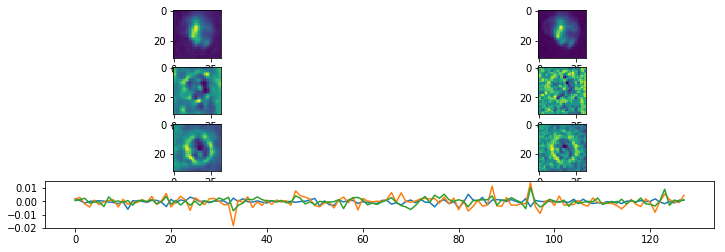

Epoch:  19 Iteration:  800 Loss:  0.07313071 0.06292911 0.010201605


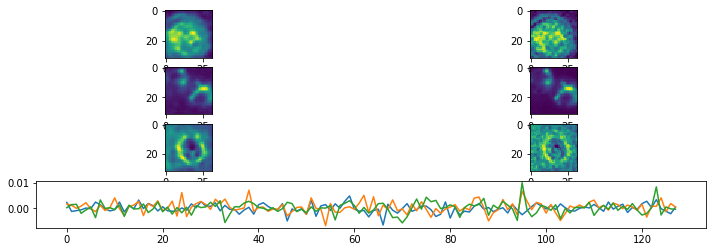

Epoch:  19 Iteration:  1000 Loss:  0.084864296 0.06563124 0.019233057


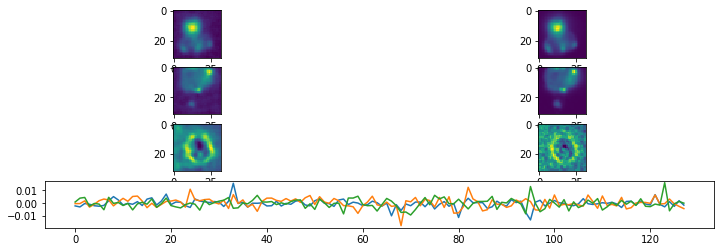

Epoch:  19 Iteration:  1200 Loss:  0.0739927 0.060991593 0.01300111


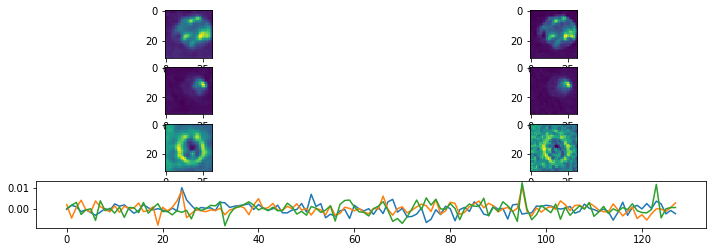

Epoch:  19 Iteration:  1400 Loss:  0.06962347 0.05794683 0.011676643


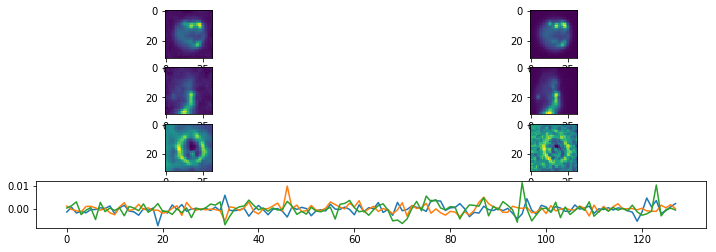

Epoch:  20 Iteration:  0 Loss:  0.072115555 0.059898213 0.01221734


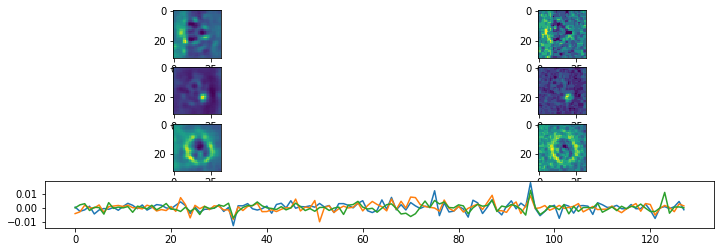

Epoch:  20 Iteration:  200 Loss:  0.08866531 0.07729164 0.011373669


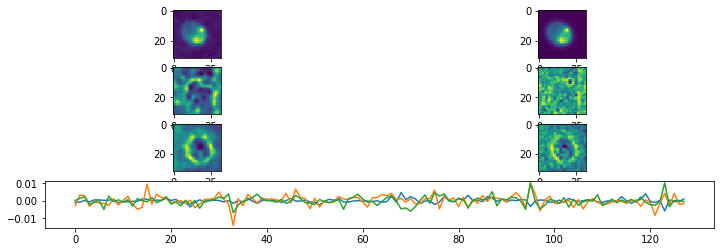

Epoch:  20 Iteration:  400 Loss:  0.07479982 0.0639163 0.01088352


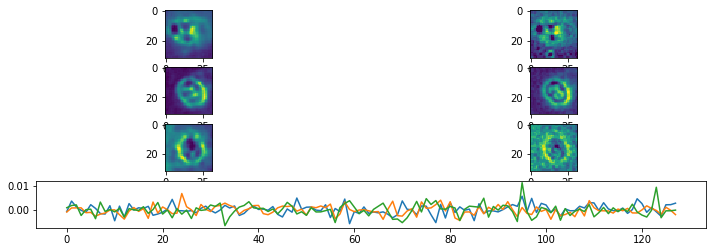

Epoch:  20 Iteration:  600 Loss:  0.06793091 0.057646938 0.010283972


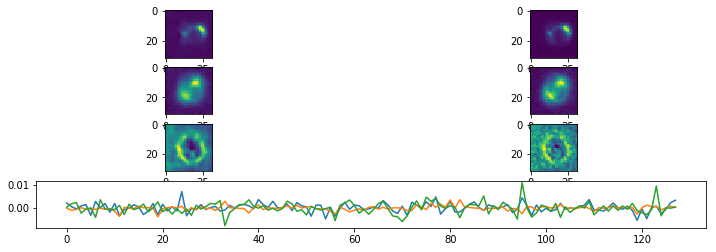

Epoch:  20 Iteration:  800 Loss:  0.072126016 0.061982267 0.0101437485


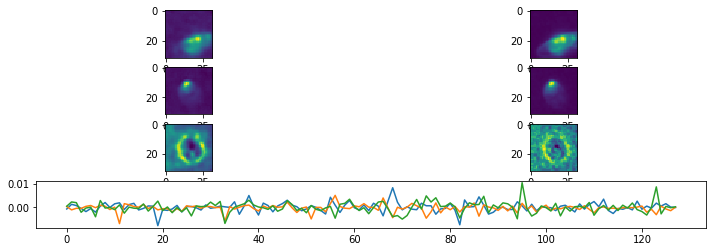

Epoch:  20 Iteration:  1000 Loss:  0.06909787 0.05851899 0.010578881


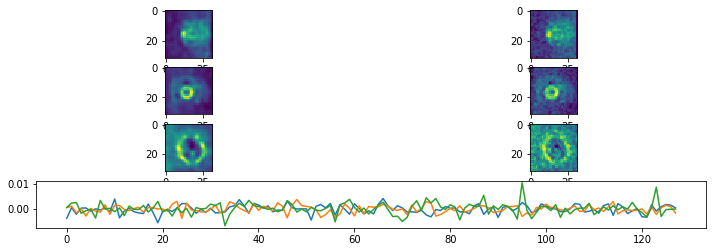

Epoch:  20 Iteration:  1200 Loss:  0.077961475 0.067683816 0.010277659


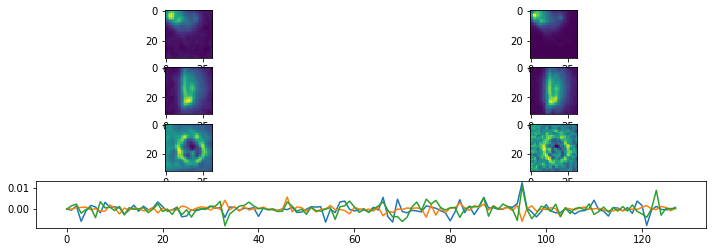

Epoch:  20 Iteration:  1400 Loss:  0.06951952 0.059107933 0.01041159


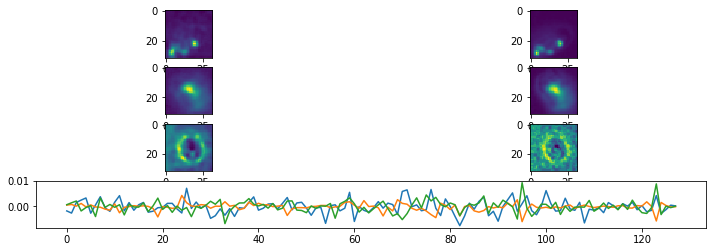

Epoch:  21 Iteration:  0 Loss:  0.070195004 0.059490107 0.010704899


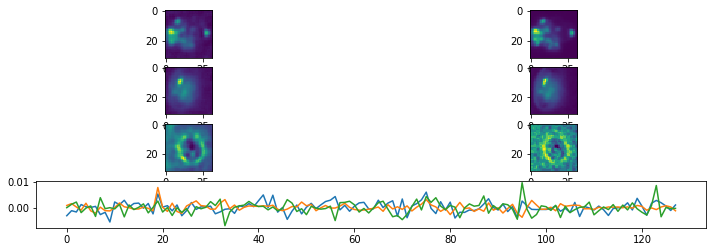

Epoch:  21 Iteration:  200 Loss:  0.099407636 0.08810328 0.011304358


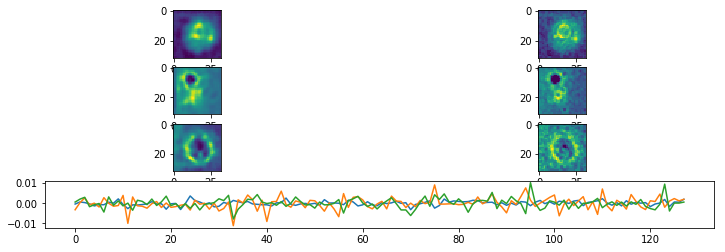

Epoch:  21 Iteration:  400 Loss:  0.071446195 0.061375096 0.010071096


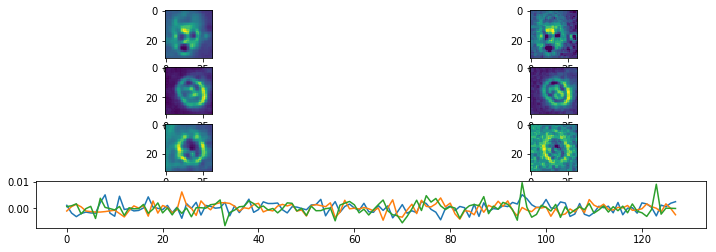

Epoch:  21 Iteration:  600 Loss:  0.07652459 0.06681295 0.009711647


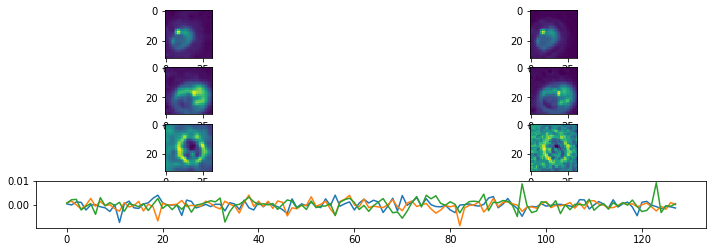

Epoch:  21 Iteration:  800 Loss:  0.117975354 0.08795033 0.030025026


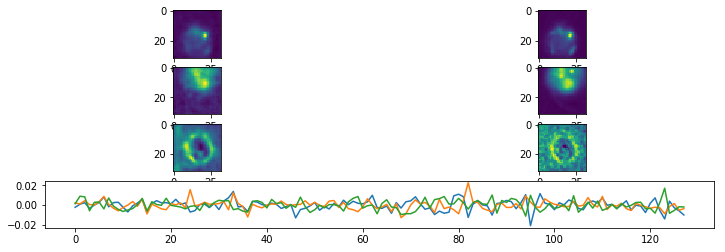

Epoch:  21 Iteration:  1000 Loss:  0.09773923 0.07392276 0.023816464


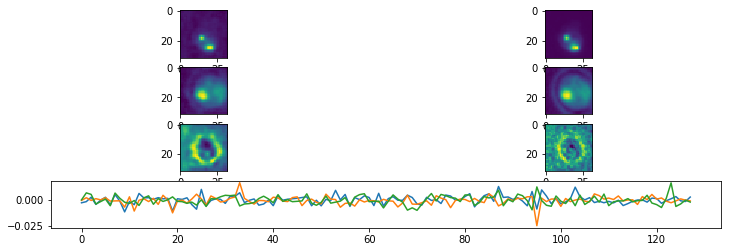

Epoch:  21 Iteration:  1200 Loss:  0.0926747 0.072179124 0.020495577


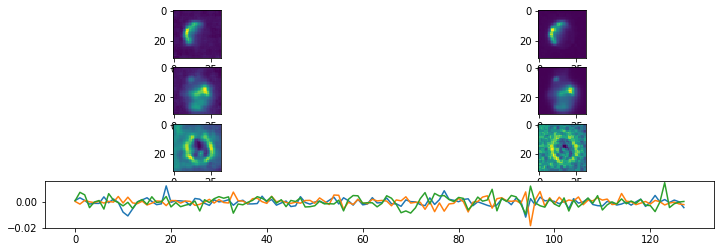

Epoch:  21 Iteration:  1400 Loss:  0.08222911 0.06397408 0.018255023


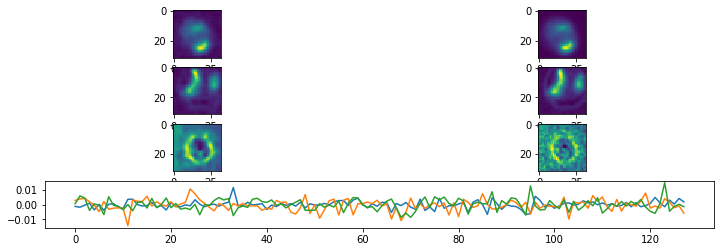

Epoch:  22 Iteration:  0 Loss:  0.08384313 0.06470401 0.01913912


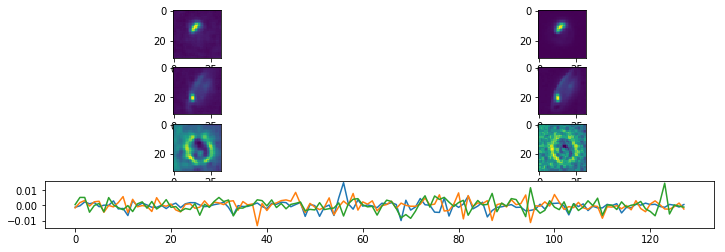

Epoch:  22 Iteration:  200 Loss:  0.0850576 0.06795642 0.017101185


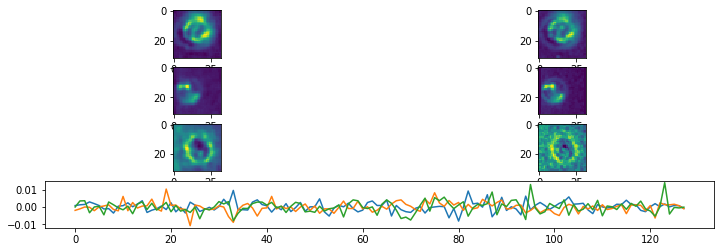

Epoch:  22 Iteration:  400 Loss:  0.08430208 0.068731084 0.015570995


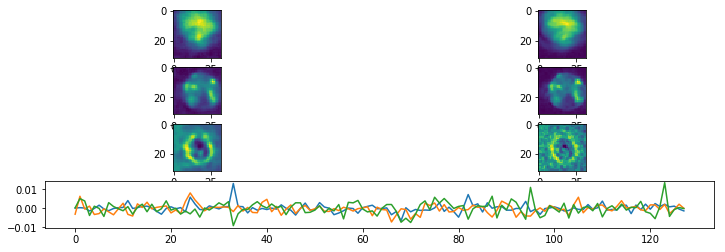

Epoch:  22 Iteration:  600 Loss:  0.07504373 0.060567282 0.0144764455


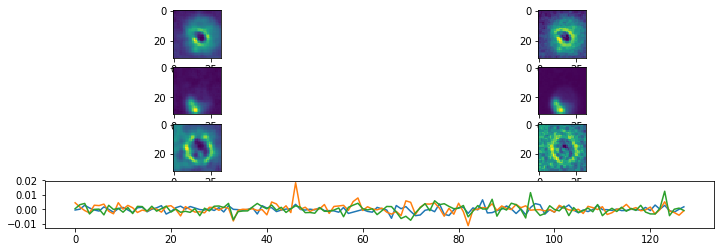

Epoch:  22 Iteration:  800 Loss:  0.07760862 0.06365028 0.0139583405


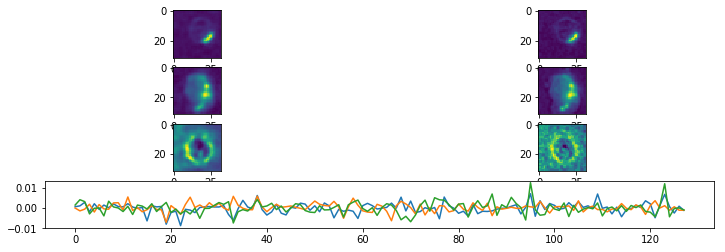

Epoch:  22 Iteration:  1000 Loss:  0.07403177 0.060321786 0.013709981


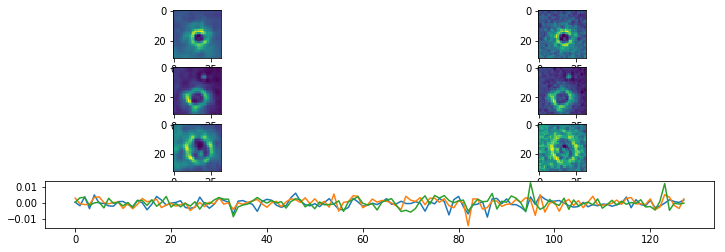

Epoch:  22 Iteration:  1200 Loss:  0.077156946 0.06438566 0.012771284


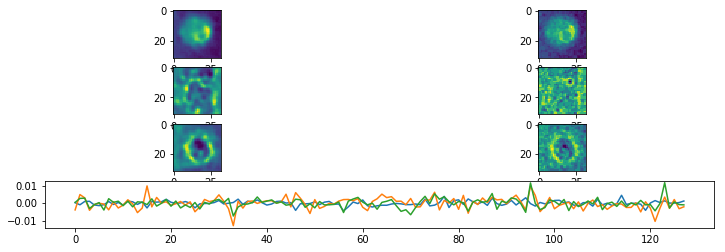

Epoch:  22 Iteration:  1400 Loss:  0.06915289 0.056557488 0.012595404


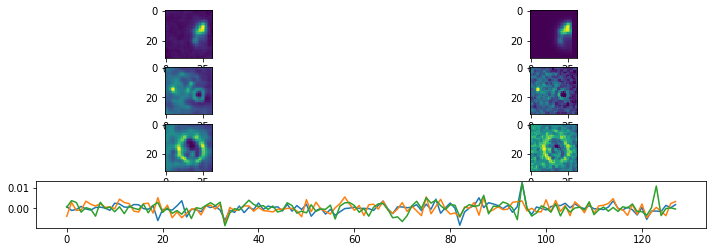

Epoch:  23 Iteration:  0 Loss:  0.07306921 0.060017608 0.013051598


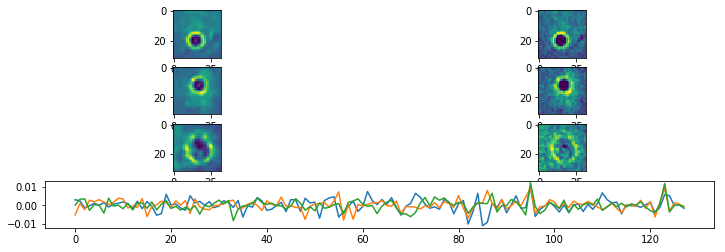

Epoch:  23 Iteration:  200 Loss:  0.082361735 0.069790155 0.012571582


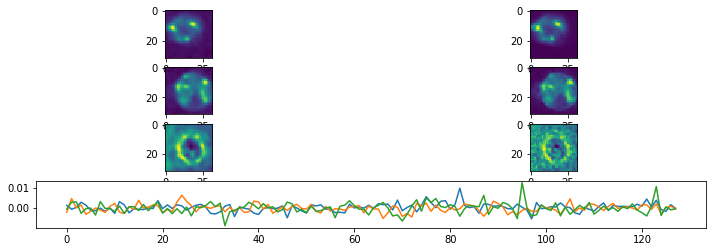

Epoch:  23 Iteration:  400 Loss:  0.073935166 0.06198983 0.011945337


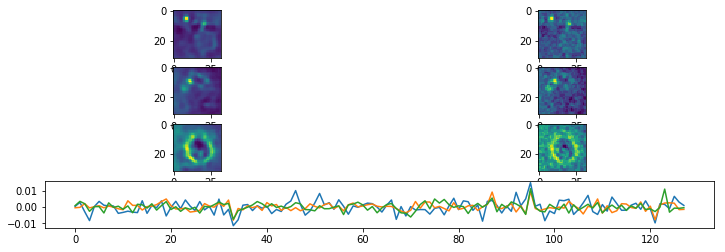

Epoch:  23 Iteration:  600 Loss:  0.074918725 0.06328972 0.011629006


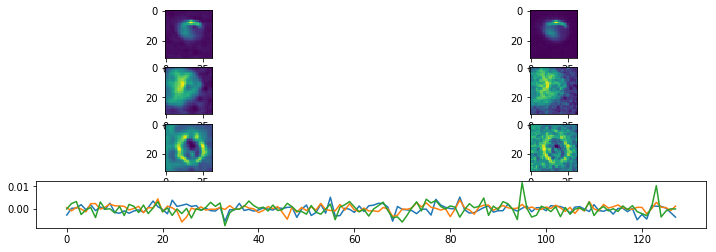

Epoch:  23 Iteration:  800 Loss:  0.07272378 0.061132297 0.0115914885


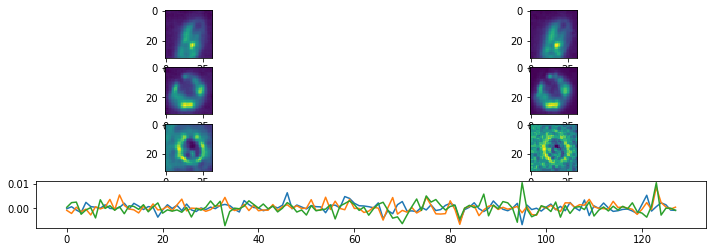

Epoch:  23 Iteration:  1000 Loss:  0.07030983 0.05868532 0.01162451


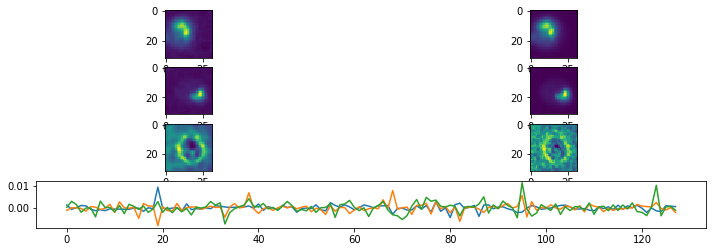

Epoch:  23 Iteration:  1200 Loss:  0.06638128 0.055522367 0.010858914


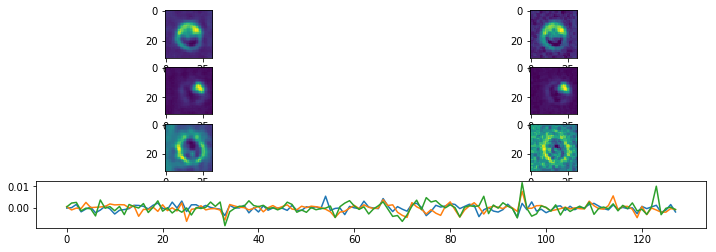

Epoch:  23 Iteration:  1400 Loss:  0.0656058 0.054742254 0.010863544


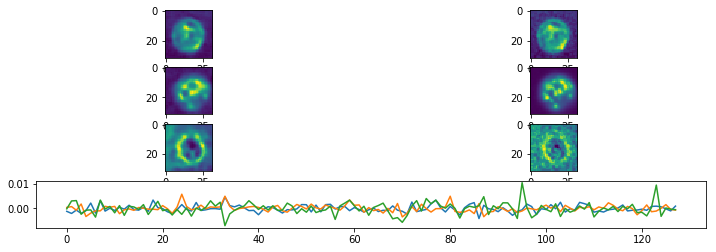

Epoch:  24 Iteration:  0 Loss:  0.070801795 0.059504837 0.011296954


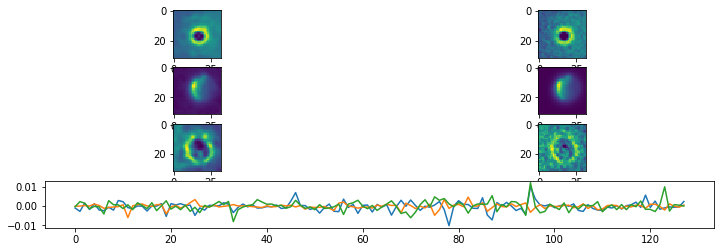

Epoch:  24 Iteration:  200 Loss:  0.07347843 0.06232863 0.011149805


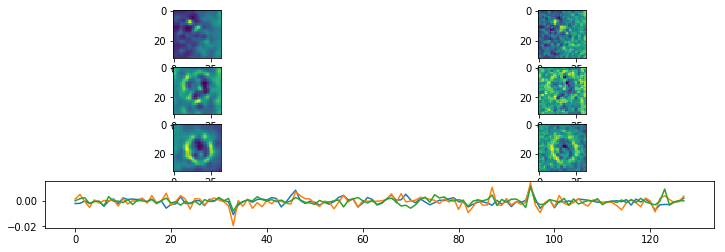

Epoch:  24 Iteration:  400 Loss:  0.071935624 0.061141714 0.010793913


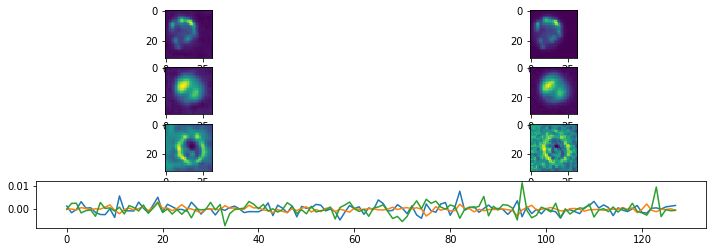

Epoch:  24 Iteration:  600 Loss:  0.06926836 0.05894969 0.01031867


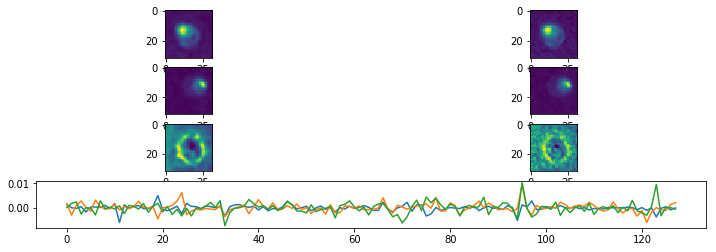

Epoch:  24 Iteration:  800 Loss:  0.07076494 0.060373742 0.010391196


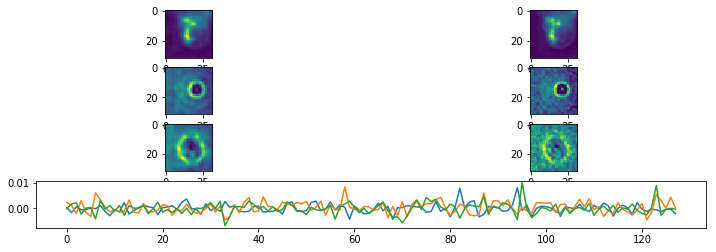

Epoch:  24 Iteration:  1000 Loss:  0.06702705 0.056280054 0.010746996


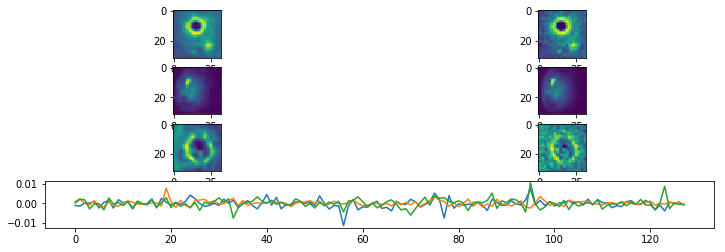

Epoch:  24 Iteration:  1200 Loss:  0.07397372 0.06371649 0.010257231


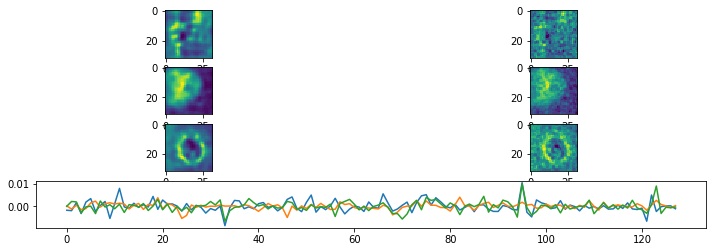

Epoch:  24 Iteration:  1400 Loss:  0.06465712 0.054331247 0.010325878


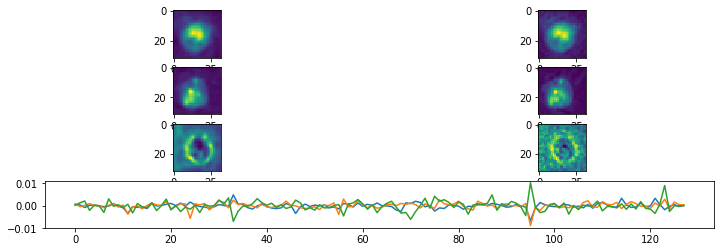

Epoch:  25 Iteration:  0 Loss:  0.06578732 0.055300064 0.010487261


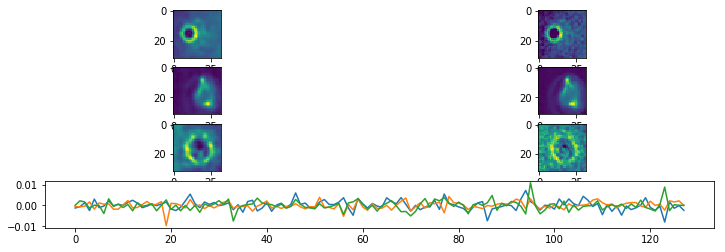

Epoch:  25 Iteration:  200 Loss:  0.0866059 0.0756763 0.0109296


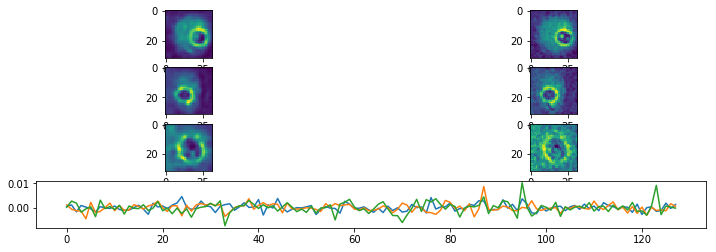

Epoch:  25 Iteration:  400 Loss:  0.08620906 0.06902317 0.017185887


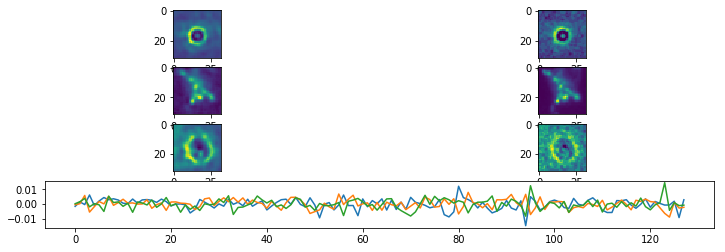

Epoch:  25 Iteration:  600 Loss:  0.07073175 0.05848219 0.01224956


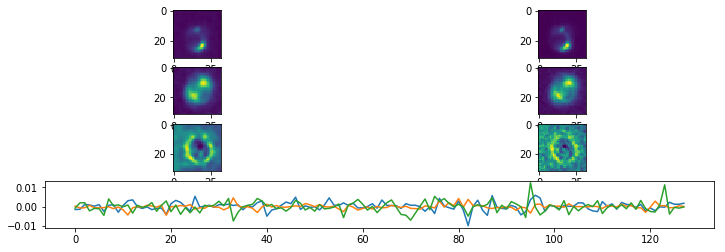

KeyboardInterrupt: 

In [7]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 1
p_channels = [1]
p_nepochs = 40
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 128 #128 + 64
p_droprate = 0.95
p_stdev = .04
p_slam = .0005
p_denoise = None
enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev
params['slam'] = p_slam
params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes
params['denoise'] = p_denoise
cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-05-31-Sparse_Channel_1_128"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 200, cpdir)

In [ ]:
x = 4
x